# scMixology Scanpy Workflow - Template


## Import and Setups


In [1]:
import os
import re
import json
import time
import platform
from datetime import datetime
from pathlib import Path

import scanpy as sc
import pandas as pd
import numpy as np
import anndata as ad
import matplotlib.pyplot as plt
import sklearn
import louvain
import scrublet as scr
from pyclustree import clustree
from sklearn.metrics import adjusted_rand_score

BASE_DIR = "/home/mtarzi/CEPH/scRNA_sequencing_scMixology_benchmarking"
DATASET = "scMixology"
VERSION = "Template"

MIN_GENES_PER_CELL = 200
MIN_CELLS_PER_GENE = 3
MAX_GENES_PER_CELL = 5000
MAX_MITO_PERCENT = 5

TARGET_SUM = 1e4
N_HVGS = 1000
N_PCS = 50
N_NEIGHBORS = 10
SELECTED_PCS = 50
TSNE_N_PCS = 50
TSNE_PERPLEXITY = 30

FINAL_SELECTED_RESOLUTION = 0.2
FINAL_METHOD = "louvain"
FINAL_RES_KEY = str(FINAL_SELECTED_RESOLUTION).replace(".", "")
FINAL_CLUSTER_KEY = f"{FINAL_METHOD}_res{FINAL_RES_KEY}"

CELLRANGER_OUTS = os.path.join(BASE_DIR, "cell_ranger", "SCMIXOLOGY", "outs")
MATRIX_DIR = os.path.join(CELLRANGER_OUTS, "filtered_feature_bc_matrix")

OUT_DIR = os.path.join(BASE_DIR, "scanpy_outputs")
TABLE_DIR = os.path.join(OUT_DIR, "tables")
FIGURE_DIR = os.path.join(OUT_DIR, "figures")
OBJECT_DIR = os.path.join(OUT_DIR, "objects")

os.makedirs(TABLE_DIR, exist_ok=True)
os.makedirs(FIGURE_DIR, exist_ok=True)
os.makedirs(OBJECT_DIR, exist_ok=True)

sc.settings.figdir = FIGURE_DIR
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=100, facecolor="white")


/home/mtarzi/.conda/envs/scRNA-python/lib/python3.11/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


## Time Tracking


In [2]:
workflow_start = time.time()

## Create AnnData Object from Cell Ranger


In [3]:
# Load cell ranger output
if not os.path.exists(MATRIX_DIR):
    raise FileNotFoundError(f"Matrix directory not found: {MATRIX_DIR}")

adata = sc.read_10x_mtx(
    MATRIX_DIR,
    var_names="gene_symbols",
    cache=False
)

adata.var_names_make_unique()


# checks
print(adata.obs.head())
print(adata.obs.columns)

adata.obs.info()
# adata.obs.head(20)

--> This might be very slow. Consider passing `cache=True`, which enables much faster reading from a cache file.
Empty DataFrame
Columns: []
Index: [AAACCTGAGAAGGGTA-1, AAACCTGAGAGACTAT-1, AAACCTGAGCCAGTAG-1, AAACCTGGTAATAGCA-1, AAACCTGGTACAGACG-1]
Index([], dtype='object')
<class 'pandas.core.frame.DataFrame'>
Index: 4488 entries, AAACCTGAGAAGGGTA-1 to TTTGTCATCCTTTACA-1
Empty DataFrame


## Add Metadata


In [4]:
# sample
adata.obs["sample"] = "SCMIXOLOGY"

#  Mitochondrial genes
adata.var["mt"] = adata.var_names.str.upper().str.startswith("MT-")

# Add riposomal gebes
adata.var["rps"] = adata.var_names.str.upper().str.startswith("RPS")
adata.var["rpl"] = adata.var_names.str.upper().str.startswith("RPL")


# Add cell-line lables as missing
#adata.obs["known_label"] = "unmatched"
adata.obs["known_label"] = pd.NA


# Cell metadata
print(adata.obs.head())
# Gene metadata
print(adata.var.head())

                        sample known_label
AAACCTGAGAAGGGTA-1  SCMIXOLOGY        <NA>
AAACCTGAGAGACTAT-1  SCMIXOLOGY        <NA>
AAACCTGAGCCAGTAG-1  SCMIXOLOGY        <NA>
AAACCTGGTAATAGCA-1  SCMIXOLOGY        <NA>
AAACCTGGTACAGACG-1  SCMIXOLOGY        <NA>
                        gene_ids    feature_types     mt    rps    rpl
DDX11L2          ENSG00000290825  Gene Expression  False  False  False
MIR1302-2HG      ENSG00000243485  Gene Expression  False  False  False
FAM138A          ENSG00000237613  Gene Expression  False  False  False
ENSG00000290826  ENSG00000290826  Gene Expression  False  False  False
OR4F5            ENSG00000186092  Gene Expression  False  False  False


In [5]:
# Save AnnData object
#adata.write_h5ad(
#    os.path.join(OBJECT_DIR, "scMixology_scanpy_processed.h5ad")
#)

# Use the AnnData object created from Cell Ranger
#INPUT_H5AD = os.path.join(OBJECT_DIR, "scMixology_raw_cellranger_filtered.h5ad")

#adata = sc.read_h5ad(INPUT_H5AD)
#print(adata)

## Add Cell-lines Labels


In [6]:
# Save Cell Ranger barcode information for metadata matching
adata.obs["barcode_cellranger"] = adata.obs_names.astype(str)

adata.obs["barcode_clean"] = (
    adata.obs["barcode_cellranger"]
    .str.replace("-1", "", regex=False)
)

adata.obs["barcode_16bp"] = (
    adata.obs_names
    .to_series()
    .astype("string")
    .str.extract(r"([ACGT]{16})", expand=False)
    .to_numpy()
)
print(adata.obs.head())
print(adata.obs.columns)

                        sample known_label  barcode_cellranger  \
AAACCTGAGAAGGGTA-1  SCMIXOLOGY        <NA>  AAACCTGAGAAGGGTA-1   
AAACCTGAGAGACTAT-1  SCMIXOLOGY        <NA>  AAACCTGAGAGACTAT-1   
AAACCTGAGCCAGTAG-1  SCMIXOLOGY        <NA>  AAACCTGAGCCAGTAG-1   
AAACCTGGTAATAGCA-1  SCMIXOLOGY        <NA>  AAACCTGGTAATAGCA-1   
AAACCTGGTACAGACG-1  SCMIXOLOGY        <NA>  AAACCTGGTACAGACG-1   

                       barcode_clean      barcode_16bp  
AAACCTGAGAAGGGTA-1  AAACCTGAGAAGGGTA  AAACCTGAGAAGGGTA  
AAACCTGAGAGACTAT-1  AAACCTGAGAGACTAT  AAACCTGAGAGACTAT  
AAACCTGAGCCAGTAG-1  AAACCTGAGCCAGTAG  AAACCTGAGCCAGTAG  
AAACCTGGTAATAGCA-1  AAACCTGGTAATAGCA  AAACCTGGTAATAGCA  
AAACCTGGTACAGACG-1  AAACCTGGTACAGACG  AAACCTGGTACAGACG  
Index(['sample', 'known_label', 'barcode_cellranger', 'barcode_clean',
       'barcode_16bp'],
      dtype='object')


In [7]:
# check whether the metadata barcodes match your Cell Ranger barcodes

CELLLINES_METADATA_DIR = "/CEPH/users/mtarzi/data/scMixology/metadata"

# Metadata files
CELL_LINE_METADATA_FILE = os.path.join(CELLLINES_METADATA_DIR,
    "scMixology_10x_celllines_metadata.csv")

celllines_metadata = pd.read_csv(CELL_LINE_METADATA_FILE)

print(celllines_metadata.shape)
print(celllines_metadata.columns)
display(celllines_metadata.head())


(3918, 31)
Index(['unaligned', 'aligned_unmapped', 'mapped_to_exon', 'mapped_to_intron',
       'ambiguous_mapping', 'mapped_to_ERCC', 'mapped_to_MT',
       'number_of_genes', 'total_count_per_cell', 'non_mt_percent',
       'non_ribo_percent', 'outliers', 'is_cell_control',
       'total_features_by_counts', 'log10_total_features_by_counts',
       'total_counts', 'log10_total_counts', 'pct_counts_in_top_50_features',
       'pct_counts_in_top_100_features', 'pct_counts_in_top_200_features',
       'pct_counts_in_top_500_features', 'total_features',
       'log10_total_features', 'pct_counts_top_50_features',
       'pct_counts_top_100_features', 'pct_counts_top_200_features',
       'pct_counts_top_500_features', 'cell_line', 'cell_line_demuxlet',
       'demuxlet_cls', 'barcode'],
      dtype='object')


,unaligned,aligned_unmapped,mapped_to_exon,mapped_to_intron,ambiguous_mapping,mapped_to_ERCC,mapped_to_MT,number_of_genes,total_count_per_cell,non_mt_percent,...,total_features,log10_total_features,pct_counts_top_50_features,pct_counts_top_100_features,pct_counts_top_200_features,pct_counts_top_500_features,cell_line,cell_line_demuxlet,demuxlet_cls,barcode
0,22485,2861,129248,10666,5503,0,9095,8344,104055,0.801874,...,8344,3.921426,27.307674,39.538705,52.677911,67.118351,HCC827,HCC827,SNG,Lib90_00000
1,20325,2383,124178,11106,5308,0,9170,8216,100421,0.802860,...,8216,3.914713,27.729260,40.342160,53.850290,68.047520,HCC827,HCC827,DBL,Lib90_00001
2,19279,2732,116260,9561,5064,0,6044,8121,93744,0.799806,...,8121,3.909663,21.509643,32.380739,45.084485,61.432198,H838,H838,SNG,Lib90_00002
3,18580,2575,109675,11012,4764,0,6806,7809,89426,0.814897,...,7809,3.892651,29.270011,43.419140,57.277526,71.056516,HCC827,HCC827,SNG,Lib90_00003
4,17759,2067,108807,9501,4809,0,4794,7807,87517,0.813591,...,7807,3.892540,26.262326,39.047271,52.941714,67.645143,HCC827,HCC827,SNG,Lib90_00004


In [8]:
# check the barcode column in cellines metadata
celllines_metadata["barcode_clean"] = (
    celllines_metadata["barcode"]
    .astype(str)
    .str.replace("-1", "", regex=False)
)

common_barcodes = set(adata.obs["barcode_clean"]).intersection(
    set(celllines_metadata["barcode_clean"])
)

print("Cell Ranger barcodes:", adata.obs["barcode_clean"].nunique())
print("Metadata barcodes:", celllines_metadata["barcode_clean"].nunique())
print("Common barcodes:", len(common_barcodes))

Cell Ranger barcodes: 4488
Metadata barcodes: 3918
Common barcodes: 0


#### Construct the Lib90_* to barcode bridge in Python


In [9]:
GENE_COUNT_FILE = os.path.join(
    CELLLINES_METADATA_DIR,
    "GSM3618014_gene_count.csv.gz"
)

BARCODE_FILE = os.path.join(
    CELLLINES_METADATA_DIR,
    "GSE126906_barcodes.csv.gz"
)

LABEL_FILE = os.path.join(
    CELLLINES_METADATA_DIR,
    "scmixology_labels_by_libid.csv"
)


print("GENE_COUNT_FILE exists:", os.path.exists(GENE_COUNT_FILE))
print("BARCODE_FILE exists:", os.path.exists(BARCODE_FILE))
print("LABEL_FILE exists:", os.path.exists(LABEL_FILE))


# Obtain the Lib90 identifiers from the count-matrix header
gene_count_columns = pd.read_csv(
    GENE_COUNT_FILE,
    compression="gzip",
    nrows=0
).columns

# First column is gene_id; remaining columns are cells.
lib_ids = pd.Series(
    gene_count_columns[1:],
    name="lib_id",
    dtype="string"
)

print("Lib90 IDs in count matrix:", len(lib_ids))
print(lib_ids.head())
print(lib_ids.tail())

GENE_COUNT_FILE exists: True
BARCODE_FILE exists: True
LABEL_FILE exists: True
Lib90 IDs in count matrix: 5001
0    Lib90_00000
1    Lib90_00001
2    Lib90_00002
3    Lib90_00003
4    Lib90_00004
Name: lib_id, dtype: string
4996    Lib90_04996
4997    Lib90_04997
4998    Lib90_04998
4999    Lib90_04999
5000    Lib90_05000
Name: lib_id, dtype: string


#### extract the 16-base barcode sequences:


In [10]:
# Read without assuming whether the file has a header or
# whether barcodes are stored by rows or columns.
raw_barcodes = pd.read_csv(
    BARCODE_FILE,
    compression="gzip",
    header=None,
    dtype="string"
)

print("Raw barcode-file shape:", raw_barcodes.shape)
print(raw_barcodes.head())

# Flatten the file while retaining its original order.
barcode_values = pd.Series(
    raw_barcodes.to_numpy().ravel(order="C"),
    dtype="string"
)

# Extract valid 16-base 10x barcode sequences.
barcode_16bp = (
    barcode_values
    .str.extract(r"([ACGT]{16})", expand=False)
    .dropna()
    .reset_index(drop=True)
    .rename("barcode_16bp")
)

print("Extracted barcodes:", len(barcode_16bp))
print(barcode_16bp.head())

Raw barcode-file shape: (5002, 3)
             0                 1      2
0    cell_name  barcode_sequence  count
1  Lib90_00000  CACACAAAGCTAAGAT   4149
2  Lib90_00001  TCAACGAGTTACGTCA   4013
3  Lib90_00002  GACTACAAGGGCTCTC   3771
4  Lib90_00003  GAAATGACACTCGACG   3535
Extracted barcodes: 5001
0    CACACAAAGCTAAGAT
1    TCAACGAGTTACGTCA
2    GACTACAAGGGCTCTC
3    GAAATGACACTCGACG
4    CACATAGTCCGTCATC
Name: barcode_16bp, dtype: string


In [11]:
# Check that Lib90 IDs and barcodes match in length
if len(barcode_16bp) != len(lib_ids):
    raise ValueError(
        "The number of extracted barcodes does not match "
        f"the number of Lib90 columns: "
        f"{len(barcode_16bp)} versus {len(lib_ids)}."
    )

#### Create the bridge:


In [12]:
barcode_bridge = pd.DataFrame({
    "lib_id": lib_ids.to_numpy(),
    "barcode_16bp": barcode_16bp.to_numpy()
})

print(barcode_bridge.head())
print(barcode_bridge.tail())

print("Duplicated Lib90 IDs:",
    barcode_bridge["lib_id"].duplicated().sum()
)

print("Duplicated barcodes:",
    barcode_bridge["barcode_16bp"].duplicated().sum()
)


        lib_id      barcode_16bp
0  Lib90_00000  CACACAAAGCTAAGAT
1  Lib90_00001  TCAACGAGTTACGTCA
2  Lib90_00002  GACTACAAGGGCTCTC
3  Lib90_00003  GAAATGACACTCGACG
4  Lib90_00004  CACATAGTCCGTCATC
           lib_id      barcode_16bp
4996  Lib90_04996  ATGTGTGGTCTGATCA
4997  Lib90_04997  ATCTGCCTCCTAGAAC
4998  Lib90_04998  ATCTGCCCAGAGTGTG
4999  Lib90_04999  ATCCGAAAGCGATGAC
5000  Lib90_05000  ATCACGATCGGCTTGG
Duplicated Lib90 IDs: 0
Duplicated barcodes: 0


#### Combine the barcode bridge with the known labels


In [13]:
reference_labels = pd.read_csv(
    LABEL_FILE,
    dtype="string"
)

print(reference_labels.shape)
print(reference_labels.head())
print(reference_labels["cell_line"].value_counts(dropna=False))

# Merge Lib90_* identifier with barcode bridge
reference_metadata = reference_labels.merge(
    barcode_bridge,
    on="lib_id",
    how="left",
    validate="one_to_one"
)

print(reference_metadata.shape)
print(reference_metadata.head())

print("Reference cells without a barcode:",
    reference_metadata["barcode_16bp"].isna().sum())

print(reference_metadata["cell_line"]
    .value_counts(dropna=False))

(3918, 2)
        lib_id cell_line
0  Lib90_00000    HCC827
1  Lib90_00001    HCC827
2  Lib90_00002      H838
3  Lib90_00003    HCC827
4  Lib90_00004    HCC827
cell_line
A549      1256
H838       876
H2228      758
HCC827     588
H1975      440
Name: count, dtype: Int64
(3918, 3)
        lib_id cell_line      barcode_16bp
0  Lib90_00000    HCC827  CACACAAAGCTAAGAT
1  Lib90_00001    HCC827  TCAACGAGTTACGTCA
2  Lib90_00002      H838  GACTACAAGGGCTCTC
3  Lib90_00003    HCC827  GAAATGACACTCGACG
4  Lib90_00004    HCC827  CACATAGTCCGTCATC
Reference cells without a barcode: 0
cell_line
A549      1256
H838       876
H2228      758
HCC827     588
H1975      440
Name: count, dtype: Int64


#### Transfer the labels into AnnData object


In [14]:
#Create the reference mapping
if reference_metadata["barcode_16bp"].duplicated().any():
    duplicated = reference_metadata.loc[
        reference_metadata["barcode_16bp"].duplicated(
            keep=False
        ),
        ["barcode_16bp", "cell_line"]
    ]

    raise ValueError(
        "Some reference barcodes occur more than once:\n"
        f"{duplicated.head()}"
    )

label_map = reference_metadata.set_index("barcode_16bp")["cell_line"]

# Replace the current "unknown" values:
adata.obs["known_label"] = (adata.obs["barcode_16bp"].map(label_map)
    .astype("category"))


# Add Known label only for plot
adata.obs["known_label_plot"] = (
    adata.obs["known_label"]
    .astype("object")
    .fillna("unmatched")
    .astype(str))

print("Known label counts:")
print(adata.obs["known_label"].value_counts(dropna=False))

print("\nKnown label plot counts:")
print(adata.obs["known_label_plot"].value_counts(dropna=False))

Known label counts:
known_label
A549      1256
H838       876
H2228      757
HCC827     587
<NA>       572
H1975      440
Name: count, dtype: int64

Known label plot counts:
known_label_plot
A549         1256
H838          876
H2228         757
HCC827        587
unmatched     572
H1975         440
Name: count, dtype: int64


#### Quantify the overlap


In [15]:
adata_barcodes = set(adata.obs["barcode_16bp"].dropna())
reference_barcodes = set(reference_metadata["barcode_16bp"].dropna())

shared_barcodes = (adata_barcodes & reference_barcodes)
adata_only = (adata_barcodes - reference_barcodes)
reference_only = (reference_barcodes - adata_barcodes)

print("Cell Ranger cells:", adata.n_obs)
print("Reference labelled cells:", len(reference_barcodes))
print("Shared labelled cells:", len(shared_barcodes))
print("Cell Ranger only:", len(adata_only))
print("Reference only:", len(reference_only))

print(
    "Percentage of Cell Ranger cells labelled:",
    round(100 * len(shared_barcodes) / adata.n_obs,2))


metadata_matching_summary = pd.DataFrame([{
    "n_cells": adata.n_obs,
    "n_genes": adata.n_vars,
    "n_reference_labelled_cells": len(reference_barcodes),
    "n_shared_barcodes": len(shared_barcodes),
    "n_cells_with_known_label": adata.obs["known_label"].notna().sum(),
    "n_cells_without_known_label": adata.obs["known_label"].isna().sum()
}])

metadata_matching_summary.to_csv(
    os.path.join(TABLE_DIR, "scMixology_scanpy_metadata_matching_summary_before_QC.csv"),
    index=False
)

metadata_matching_summary

#inspect
display(adata.obs[
        ["sample", "barcode_cellranger", "barcode_16bp", "known_label", "known_label_plot"]
    ].head(20)
)

Cell Ranger cells: 4488
Reference labelled cells: 3918
Shared labelled cells: 3916
Cell Ranger only: 572
Reference only: 2
Percentage of Cell Ranger cells labelled: 87.25


,sample,barcode_cellranger,barcode_16bp,known_label,known_label_plot
AAACCTGAGAAGGGTA-1,SCMIXOLOGY,AAACCTGAGAAGGGTA-1,AAACCTGAGAAGGGTA,H1975,H1975
AAACCTGAGAGACTAT-1,SCMIXOLOGY,AAACCTGAGAGACTAT-1,AAACCTGAGAGACTAT,H1975,H1975
AAACCTGAGCCAGTAG-1,SCMIXOLOGY,AAACCTGAGCCAGTAG-1,AAACCTGAGCCAGTAG,H838,H838
AAACCTGGTAATAGCA-1,SCMIXOLOGY,AAACCTGGTAATAGCA-1,AAACCTGGTAATAGCA,H838,H838
AAACCTGGTACAGACG-1,SCMIXOLOGY,AAACCTGGTACAGACG-1,AAACCTGGTACAGACG,H2228,H2228
AAACCTGGTCTAACGT-1,SCMIXOLOGY,AAACCTGGTCTAACGT-1,AAACCTGGTCTAACGT,H2228,H2228
AAACCTGTCCGCGCAA-1,SCMIXOLOGY,AAACCTGTCCGCGCAA-1,AAACCTGTCCGCGCAA,H2228,H2228
AAACCTGTCCTTTCTC-1,SCMIXOLOGY,AAACCTGTCCTTTCTC-1,AAACCTGTCCTTTCTC,H1975,H1975
AAACCTGTCTGCCCTA-1,SCMIXOLOGY,AAACCTGTCTGCCCTA-1,AAACCTGTCTGCCCTA,A549,A549
AAACCTGTCTTGCCGT-1,SCMIXOLOGY,AAACCTGTCTTGCCGT-1,AAACCTGTCTTGCCGT,H1975,H1975


#### Check


In [16]:
print(adata)

# Cell metadata
print(adata.obs.head())
# Gene metadata
print(adata.var.head())

AnnData object with n_obs × n_vars = 4488 × 38606
    obs: 'sample', 'known_label', 'barcode_cellranger', 'barcode_clean', 'barcode_16bp', 'known_label_plot'
    var: 'gene_ids', 'feature_types', 'mt', 'rps', 'rpl'
                        sample known_label  barcode_cellranger  \
AAACCTGAGAAGGGTA-1  SCMIXOLOGY       H1975  AAACCTGAGAAGGGTA-1   
AAACCTGAGAGACTAT-1  SCMIXOLOGY       H1975  AAACCTGAGAGACTAT-1   
AAACCTGAGCCAGTAG-1  SCMIXOLOGY        H838  AAACCTGAGCCAGTAG-1   
AAACCTGGTAATAGCA-1  SCMIXOLOGY        H838  AAACCTGGTAATAGCA-1   
AAACCTGGTACAGACG-1  SCMIXOLOGY       H2228  AAACCTGGTACAGACG-1   

                       barcode_clean      barcode_16bp known_label_plot  
AAACCTGAGAAGGGTA-1  AAACCTGAGAAGGGTA  AAACCTGAGAAGGGTA            H1975  
AAACCTGAGAGACTAT-1  AAACCTGAGAGACTAT  AAACCTGAGAGACTAT            H1975  
AAACCTGAGCCAGTAG-1  AAACCTGAGCCAGTAG  AAACCTGAGCCAGTAG             H838  
AAACCTGGTAATAGCA-1  AAACCTGGTAATAGCA  AAACCTGGTAATAGCA             H838  
AAACCTGGTACAGACG-1

## QC Metrics and Plots


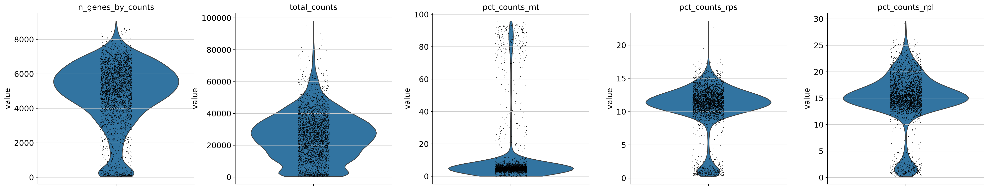

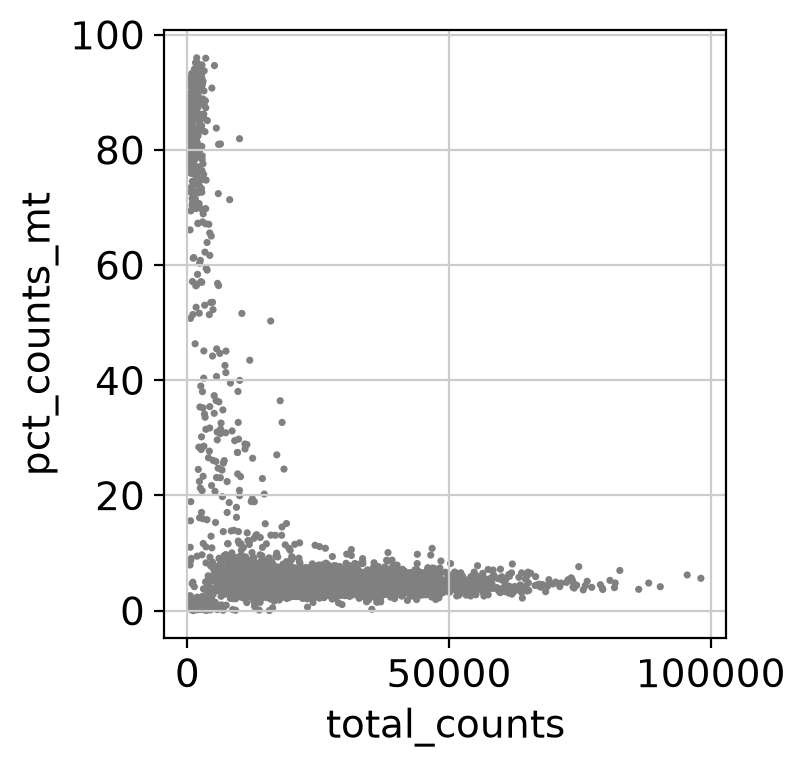

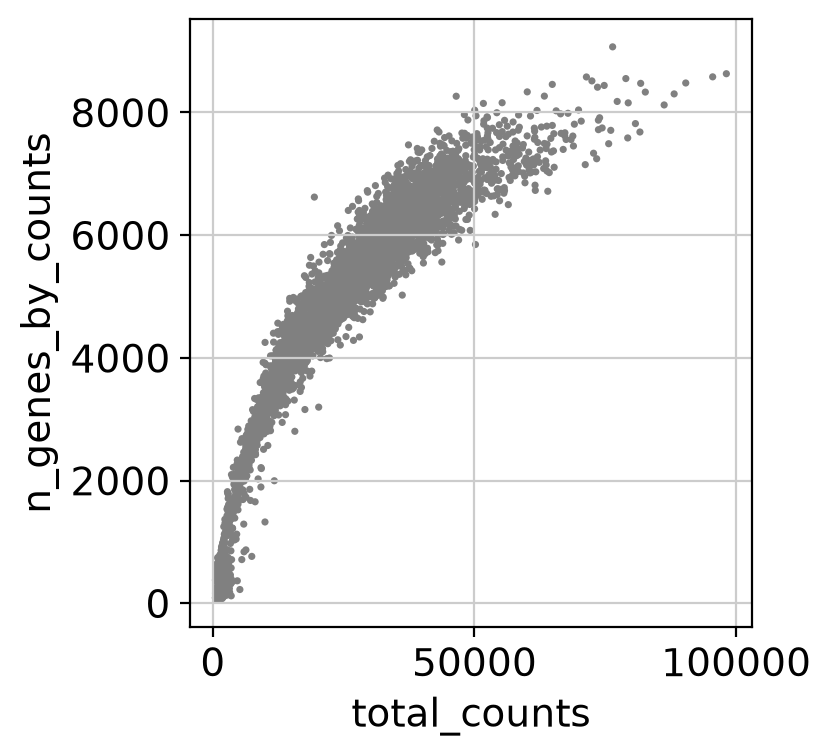

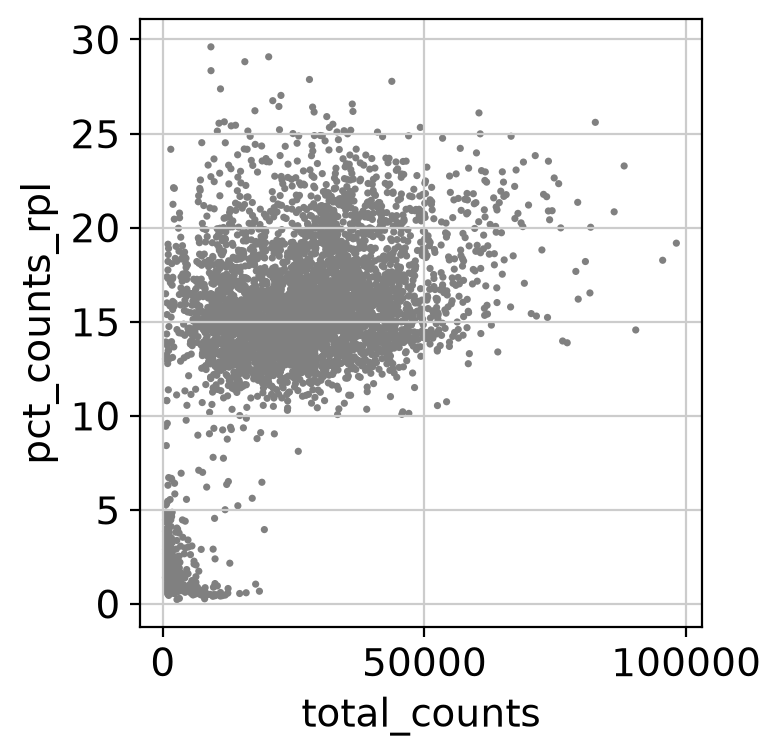

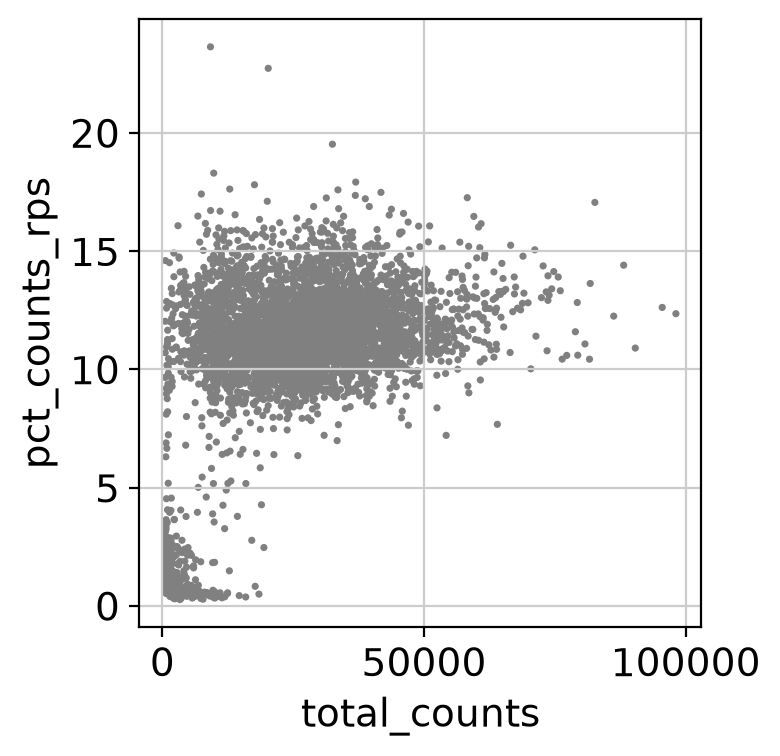

In [17]:
sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=["mt","rps","rpl"],
    percent_top=None,
    log1p=False,
    inplace=True
)

qc_before = adata.obs[
    ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_rps", "pct_counts_rpl"]
].describe()

qc_before.to_csv(
    os.path.join(TABLE_DIR, "scMixology_scanpy_qc_summary_before_filtering.csv")
)

qc_before

sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_rps", "pct_counts_rpl"],
    multi_panel=True,
    save="_scMixology_scanpy_qc_before_filtering.png"
)


sc.pl.scatter(
    adata,
    x="total_counts",
    y="pct_counts_mt",
    save="_scMixology_scanpy_counts_vs_mt.png"
)

sc.pl.scatter(
    adata,
    x="total_counts",
    y="n_genes_by_counts",
    save="_scMixology_scanpy_counts_vs_genes.png"
)

sc.pl.scatter(
    adata,
    x="total_counts",
    y="pct_counts_rpl",
    save="_scMixology_scanpy_counts_vs_rpl"
)

sc.pl.scatter(
    adata,
    x="total_counts",
    y="pct_counts_rps",
    save="_scMixology_scanpy_counts_vs_rps"
)

## Save AnnData object before filtering


In [18]:
adata_prefilter = adata.copy()

for col in adata_prefilter.obs.columns:
    if adata_prefilter.obs[col].dtype.name in ["object", "string", "category"]:
        adata_prefilter.obs[col] = (
            adata_prefilter.obs[col]
            .astype("object")
            .where(adata_prefilter.obs[col].notna(), "unmatched")
            .astype(str)
        )

prefilter_h5ad = os.path.join(
    OBJECT_DIR,
    "scMixology_scanpy_prefilter_with_metadata.h5ad"
)

adata_prefilter.write_h5ad(prefilter_h5ad)

## Filtering


In [19]:
# Before filtering
initial_cells = adata.n_obs
initial_genes = adata.n_vars

print(f"Number of cells before filtering: {initial_cells}")
print(f"Number of genes before filtering: {initial_genes}")


# Basic filtering
sc.pp.filter_cells(adata, min_genes= MIN_GENES_PER_CELL)
sc.pp.filter_genes(adata, min_cells= MIN_CELLS_PER_GENE)


# Extra QC filtering
adata = adata[
    (adata.obs["n_genes_by_counts"] < MAX_GENES_PER_CELL) &
    (adata.obs["pct_counts_mt"] < MAX_MITO_PERCENT),
    :
].copy()


# After filtering
filtered_cells = adata.n_obs
filtered_genes = adata.n_vars

print("After filtering:")
print(adata)

print(f"Number of cells after filtering: {filtered_cells}")
print(f"Number of genes after filtering: {filtered_genes}")


# Filter summary
filtering_summary = pd.DataFrame([{
    "initial_cells": initial_cells,
    "filtered_cells": filtered_cells,
    "removed_cells": initial_cells - filtered_cells,
    "initial_genes": initial_genes,
    "filtered_genes": filtered_genes,
    "removed_genes": initial_genes - filtered_genes,
    "min_genes_per_cell": MIN_GENES_PER_CELL,
    "min_cells_per_gene": MIN_CELLS_PER_GENE,
    "max_genes_per_cell": MAX_GENES_PER_CELL,
    "max_mito_percent": MAX_MITO_PERCENT
}])

#Save
filtering_summary.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_filtering_summary.csv"),
    index=False
)


Number of cells before filtering: 4488
Number of genes before filtering: 38606
filtered out 170 cells that have less than 200 genes expressed
filtered out 12322 genes that are detected in less than 3 cells
After filtering:
AnnData object with n_obs × n_vars = 780 × 26284
    obs: 'sample', 'known_label', 'barcode_cellranger', 'barcode_clean', 'barcode_16bp', 'known_label_plot', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_rps', 'pct_counts_rps', 'total_counts_rpl', 'pct_counts_rpl', 'n_genes'
    var: 'gene_ids', 'feature_types', 'mt', 'rps', 'rpl', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'
Number of cells after filtering: 780
Number of genes after filtering: 26284


In [20]:
filtering_summary

,initial_cells,filtered_cells,removed_cells,initial_genes,filtered_genes,removed_genes,min_genes_per_cell,min_cells_per_gene,max_genes_per_cell,max_mito_percent
0,4488,780,3708,38606,26284,12322,200,3,5000,5


## QC metrics and Plots after filtering


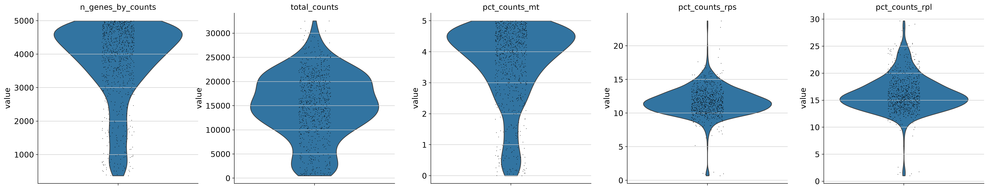

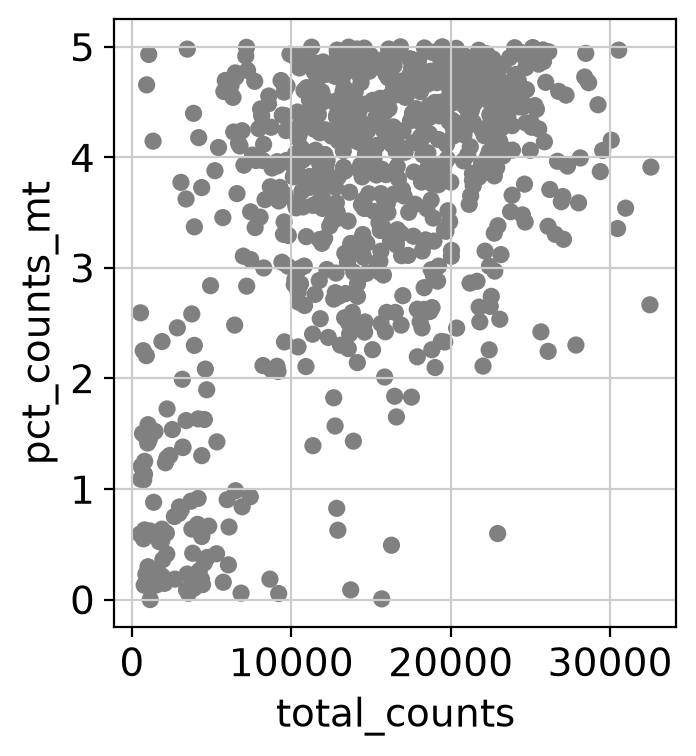

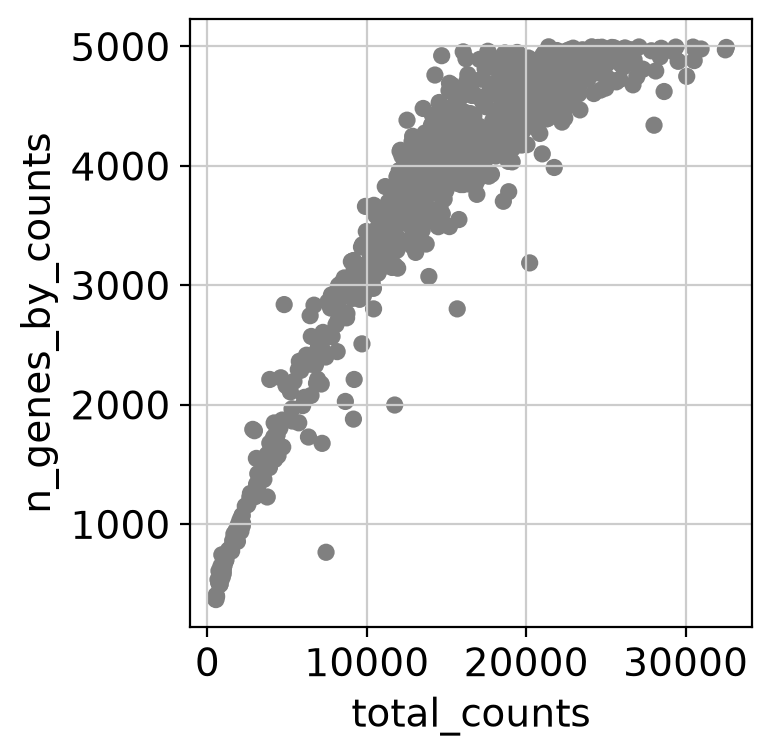

In [21]:
sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=["mt", "rps", "rpl"],
    percent_top=None,
    log1p=False,
    inplace=True
)

qc_after = adata.obs[
    ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_rps", "pct_counts_rpl"]
].describe()

qc_after.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_qc_summary_after_filtering.csv")
)

sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_rps", "pct_counts_rpl"],
    multi_panel=True,
    save=f"_scMixology_scanpy_{VERSION}_qc_after_filtering.png"
)

sc.pl.scatter(
    adata,
    x="total_counts",
    y="pct_counts_mt",
    save=f"_scMixology_scanpy_{VERSION}_counts_vs_mt_after_filtering.png"
)

sc.pl.scatter(
    adata,
    x="total_counts",
    y="n_genes_by_counts",
    save=f"_scMixology_scanpy_{VERSION}_counts_vs_genes_after_filtering.png"
)



## Remove Doublets


In [22]:
# Save counts before normalization
counts_matrix = adata.X.copy()

scrub = scr.Scrublet(counts_matrix)

doublet_scores, predicted_doublets = scrub.scrub_doublets()

adata.obs["doublet_score"] = doublet_scores
adata.obs["predicted_doublet"] = predicted_doublets

adata.obs["predicted_doublet"].value_counts()

# save doublet summary
doublet_summary = pd.DataFrame({
    "category": ["singlet", "doublet"],
    "n_cells": [
        (~adata.obs["predicted_doublet"]).sum(),
        adata.obs["predicted_doublet"].sum()
    ]
})

doublet_summary.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_doublet_summary.csv"),
    index=False
)

print("Before doublet removal:", adata.shape)

# remove predicted doublets
adata = adata[~adata.obs["predicted_doublet"]].copy()

print("After doublet removal:", adata.shape)


doublet_summary


Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.33
Detected doublet rate = 0.8%
Estimated detectable doublet fraction = 47.9%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 1.6%
Elapsed time: 1.1 seconds
Before doublet removal: (780, 26284)
After doublet removal: (774, 26284)


,category,n_cells
0,singlet,774
1,doublet,6


## Normalize and log-transform


In [23]:
sc.pp.normalize_total(adata, target_sum=TARGET_SUM)
sc.pp.log1p(adata)



normalizing counts per cell
    finished (0:00:00)


In [24]:
# save log-normalized matrix before HVG subsetting
adata.raw = adata.copy()

## High Variable Genes


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


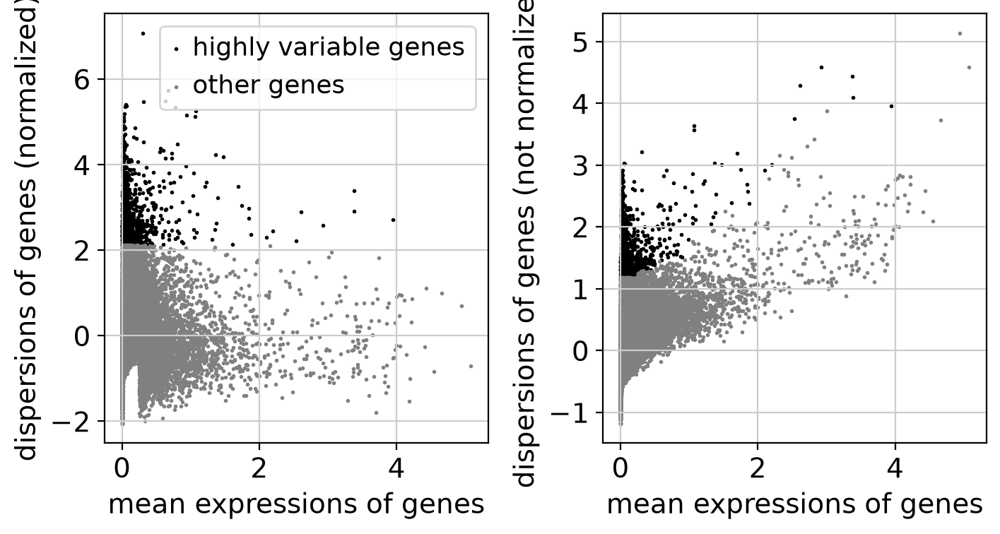

In [25]:
sc.pp.highly_variable_genes(
    adata,
    min_mean=0.0125,
    max_mean=3,
    min_disp=0.5,
    n_top_genes=N_HVGS
)

sc.pl.highly_variable_genes(adata, save=f"_scMixology_scanpy_{VERSION}_HVGs.png")


hvg_table = adata.var[adata.var["highly_variable"]].copy()
hvg_table.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_highly_variable_genes.csv")
)

# to use HVGs for downstream analysis
adata = adata[:, adata.var["highly_variable"]].copy()

## Scale Data


In [26]:
# Scale
sc.pp.scale(adata, max_value=10)



/home/mtarzi/.conda/envs/scRNA-python/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


##  PCA


computing PCA
    with n_comps=50
    finished (0:00:00)


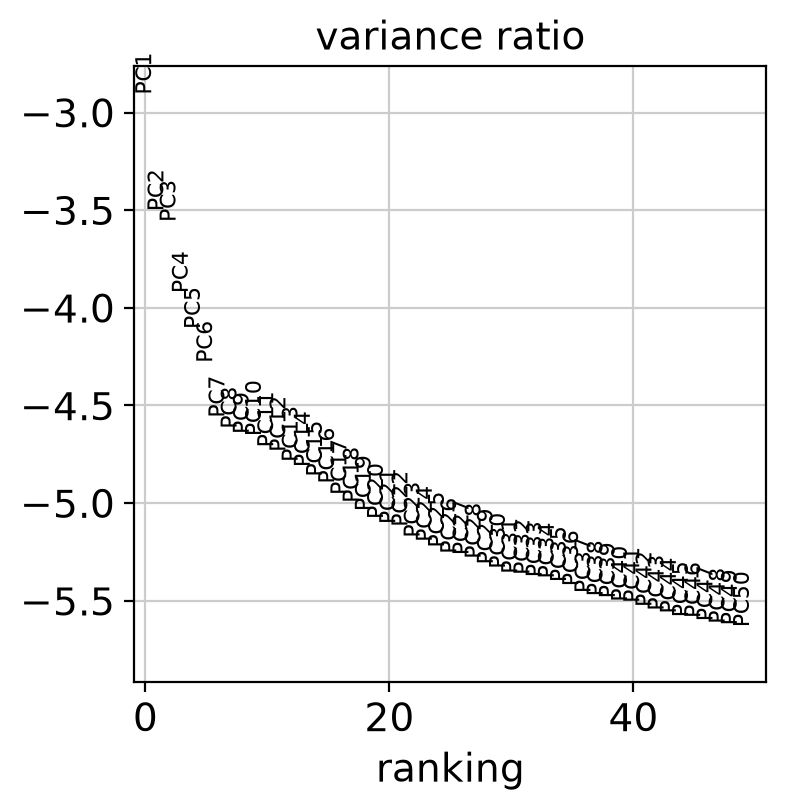

In [27]:
sc.tl.pca(adata, n_comps=N_PCS, svd_solver="arpack")

sc.pl.pca_variance_ratio(adata, n_pcs=N_PCS, log=True, save=f"_scMixology_scanpy_{VERSION}.png")


## Calculate PC Range and Select PCs  manually


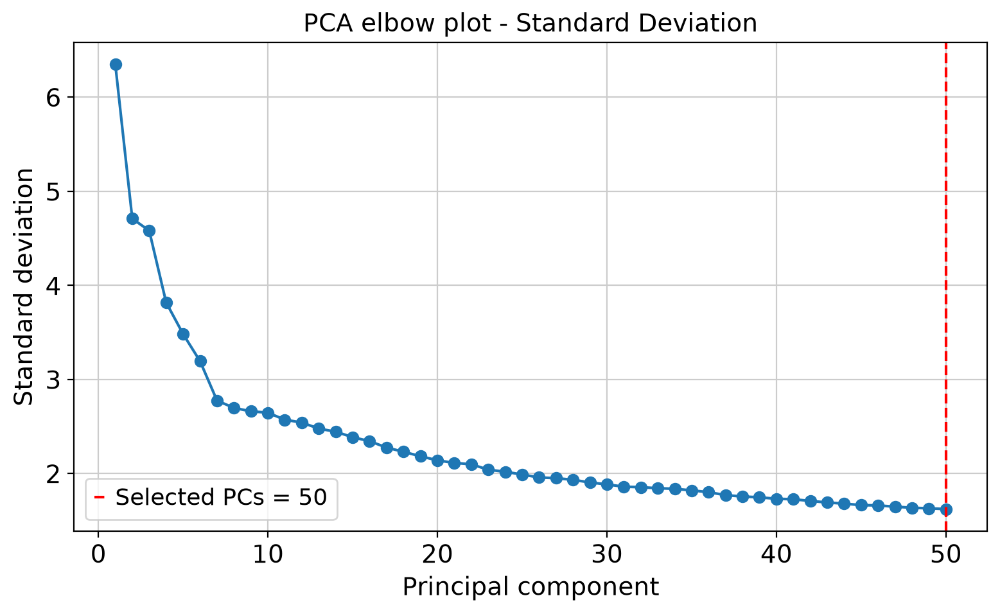

In [28]:
SELECTED_PCS = N_PCS

# Get PCA standard deviation
pc_stdev = np.sqrt(adata.uns["pca"]["variance"])
pcs = np.arange(1, len(pc_stdev) + 1)

plt.figure(figsize=(8, 5))

plt.plot(pcs, pc_stdev, marker="o")
plt.axvline(
    x=SELECTED_PCS,
    color="red",
    linestyle="--",
    linewidth=1.5,
    label=f"Selected PCs = {SELECTED_PCS}"
)

plt.xlabel("Principal component")
plt.ylabel("Standard deviation")
plt.title("PCA elbow plot - Standard Deviation")
plt.legend()
plt.tight_layout()

plt.savefig(
    os.path.join(FIGURE_DIR,f"scMixology_scanpy_{VERSION}_PCA_elbow_selected_PCs.png"),
    dpi=300
)

plt.show()

Recommended PC range: 2 to 50
Selected PCs: 50


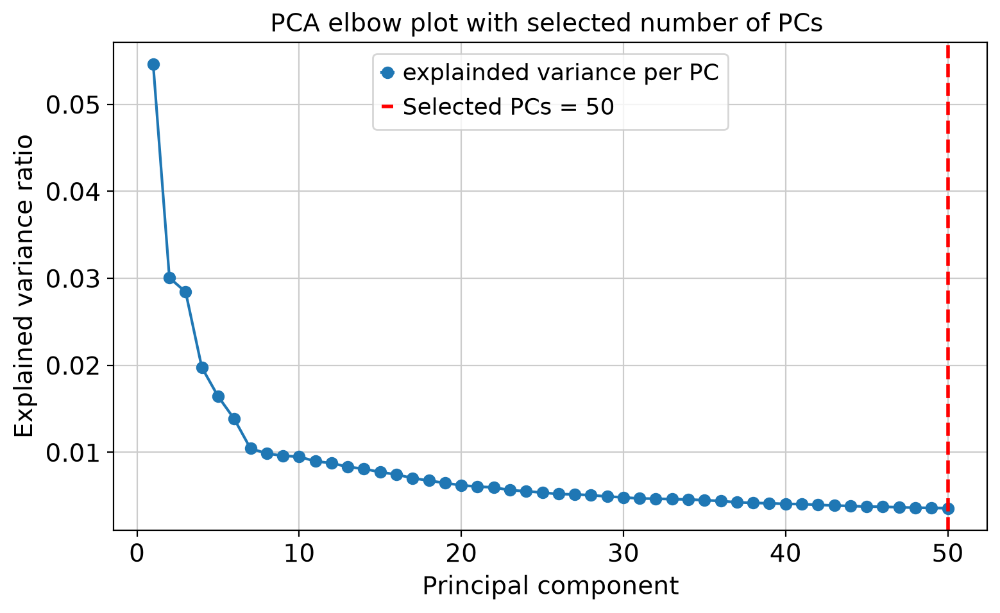

In [29]:
# explained variance ratio
pc_var_ratio = adata.uns["pca"]["variance_ratio"]
pcs = np.arange(1, len(pc_var_ratio) + 1)


# Criterion 1:
# first PC where cumulative variance is greater than 90%
# and individual PC contribution is less than 5%
co1_candidates = np.where(
    (pcs > 90) &
    (pc_var_ratio < 5)
)[0]

if len(co1_candidates) > 0:
    co1 = co1_candidates[0] + 1
else:
    co1 = len(pc_var_ratio)

# Criterion 2:
# last PC where the drop in variance between consecutive PCs is more than 0.01%
pc_variance_drop = pc_var_ratio[:-1] - pc_var_ratio[1:]

co2_candidates = np.where(pc_variance_drop > 0.01)[0]

if len(co2_candidates) > 0:
    co2 = co2_candidates[-1] + 2
else:
    co2 = len(pc_var_ratio)

# Recommended PC range
PC_RANGE_MIN = min(co1, co2)
PC_RANGE_MAX = max(co1, co2)


print("Recommended PC range:", PC_RANGE_MIN, "to", PC_RANGE_MAX)


SELECTED_PCS = 50
print("Selected PCs:", SELECTED_PCS)

plt.figure(figsize=(8, 5))

plt.plot(pcs, pc_var_ratio, marker="o", label="explainded variance per PC")
plt.axvline(
    x=SELECTED_PCS,
    color="red",
    linestyle="--",
    linewidth=2,
    label=f"Selected PCs = {SELECTED_PCS}"
)

plt.xlabel("Principal component")
plt.ylabel("Explained variance ratio")
plt.title("PCA elbow plot with selected number of PCs ")
plt.legend()
plt.tight_layout()

plt.savefig(
    os.path.join(FIGURE_DIR,f"scMixology_scanpy_{VERSION}_PCA_elbow_variance_ratio_selected_PCs.png"),
    dpi=300
)

plt.show()

## Build neighborhood graph


In [30]:
sc.pp.neighbors(
    adata,
    n_neighbors=N_NEIGHBORS,
    n_pcs=SELECTED_PCS
)

computing neighbors
    using 'X_pca' with n_pcs = 50


/home/mtarzi/.conda/envs/scRNA-python/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)


## UMAP & t-SNE


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:01)


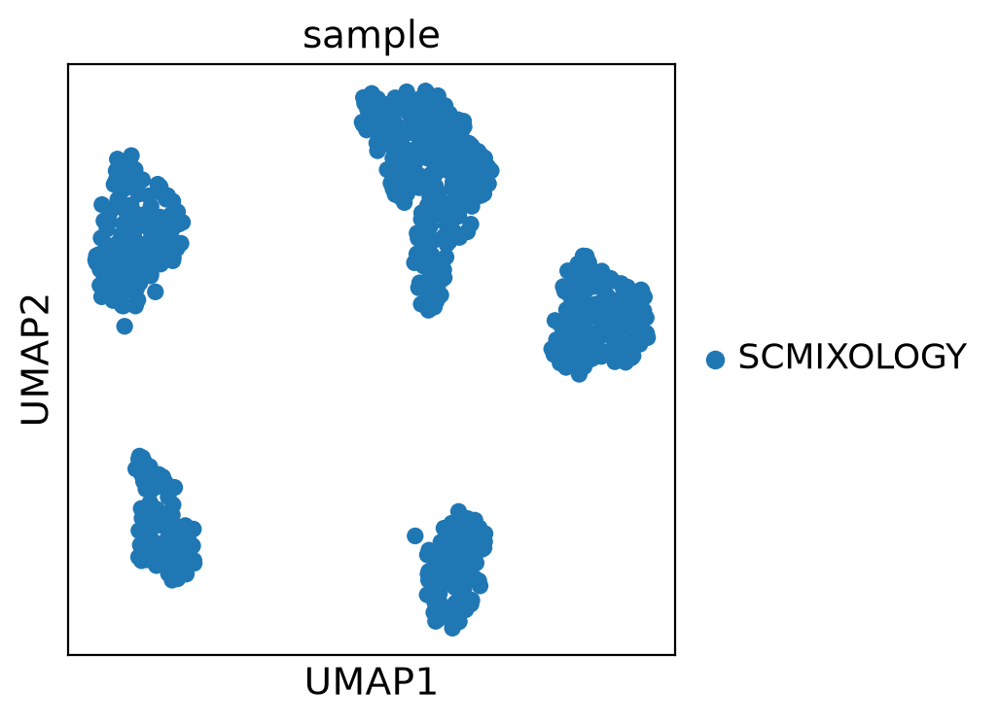

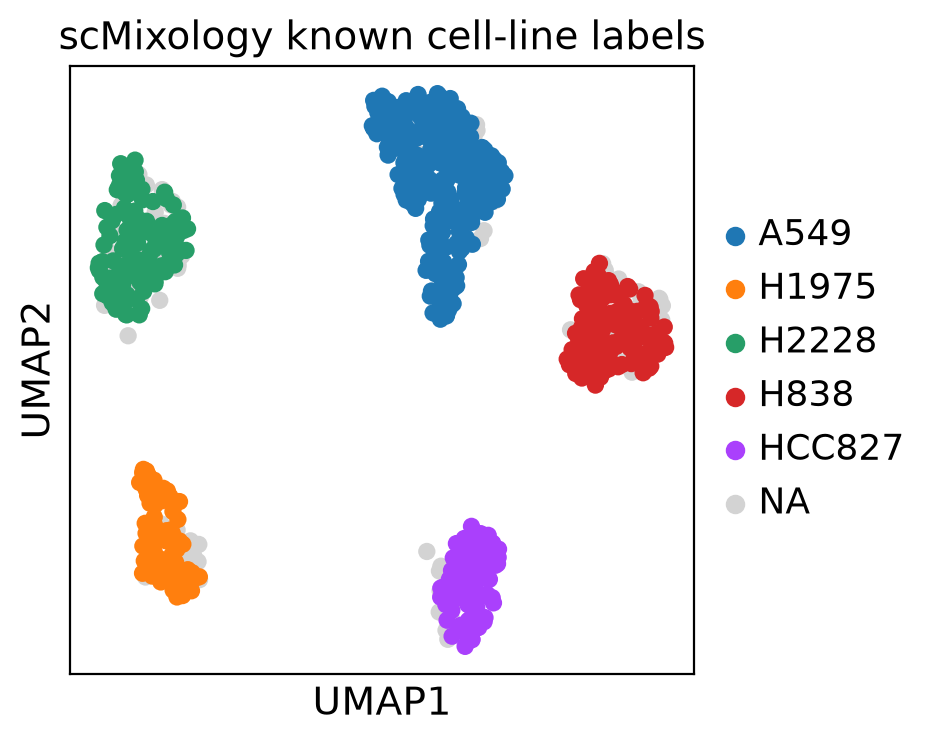

computing tSNE
    using 'X_pca' with n_pcs = 50
    using sklearn.manifold.TSNE
    finished: added
    'X_tsne', tSNE coordinates (adata.obsm)
    'tsne', tSNE parameters (adata.uns) (0:00:01)


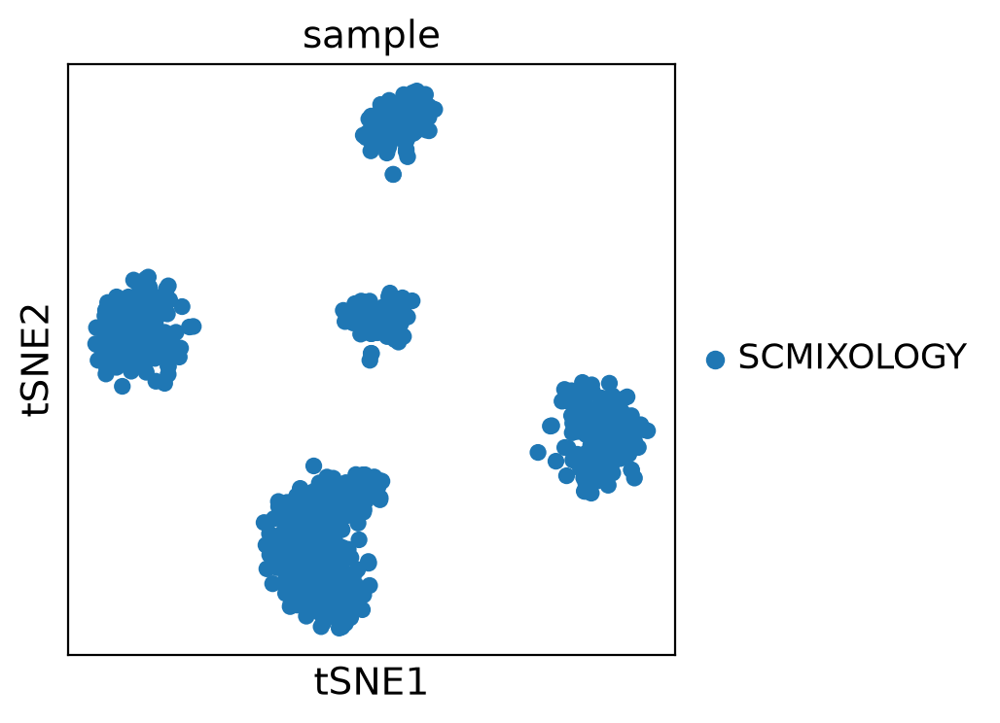

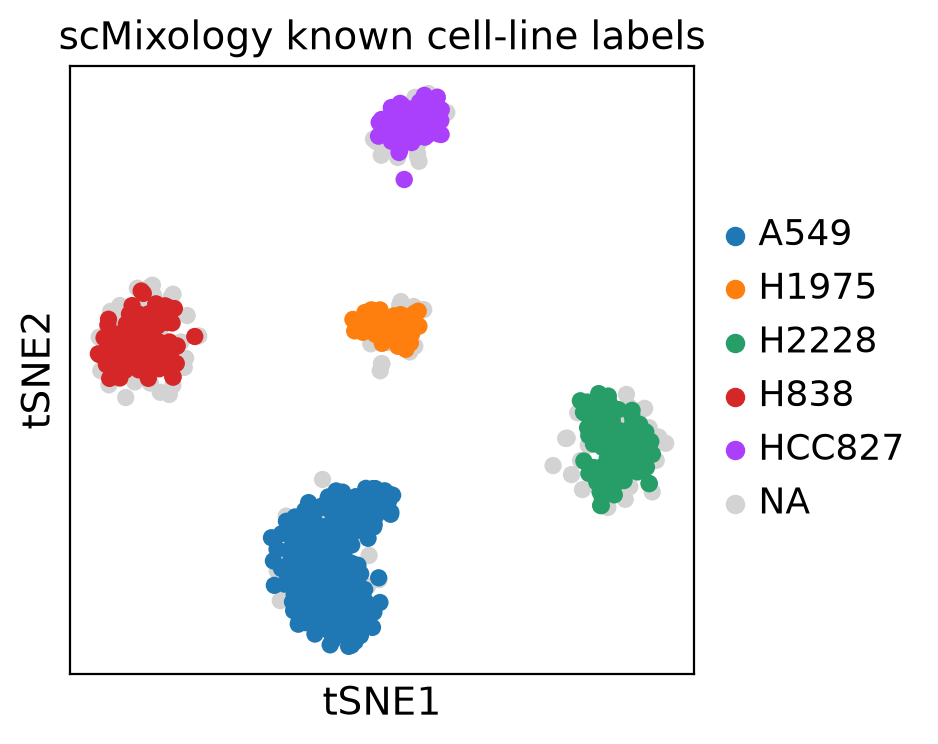

In [31]:
# UMAP
sc.tl.umap(adata)

sc.pl.umap(adata, color=["sample"],
    legend_loc="right margin",
    save=f"_scMixology_scanpy_{VERSION}_sample.png")


sc.pl.umap(
    adata,
    color="known_label",
    legend_loc="right margin",
    title="scMixology known cell-line labels",
    save=f"_scMixology_{VERSION}_known_labels"
)

# t-SNE
sc.tl.tsne(
    adata,
    n_pcs=SELECTED_PCS,
    perplexity=TSNE_PERPLEXITY
)

sc.pl.tsne(
    adata,
    color=["sample"],
    legend_loc="right margin",
    save=f"_scMixology_scanpy_{VERSION}_sample.png"
)


sc.pl.tsne(
    adata,
    color="known_label",
    legend_loc="right margin",
    title="scMixology known cell-line labels",
    save=f"_scMixology_{VERSION}_known_labels"
)



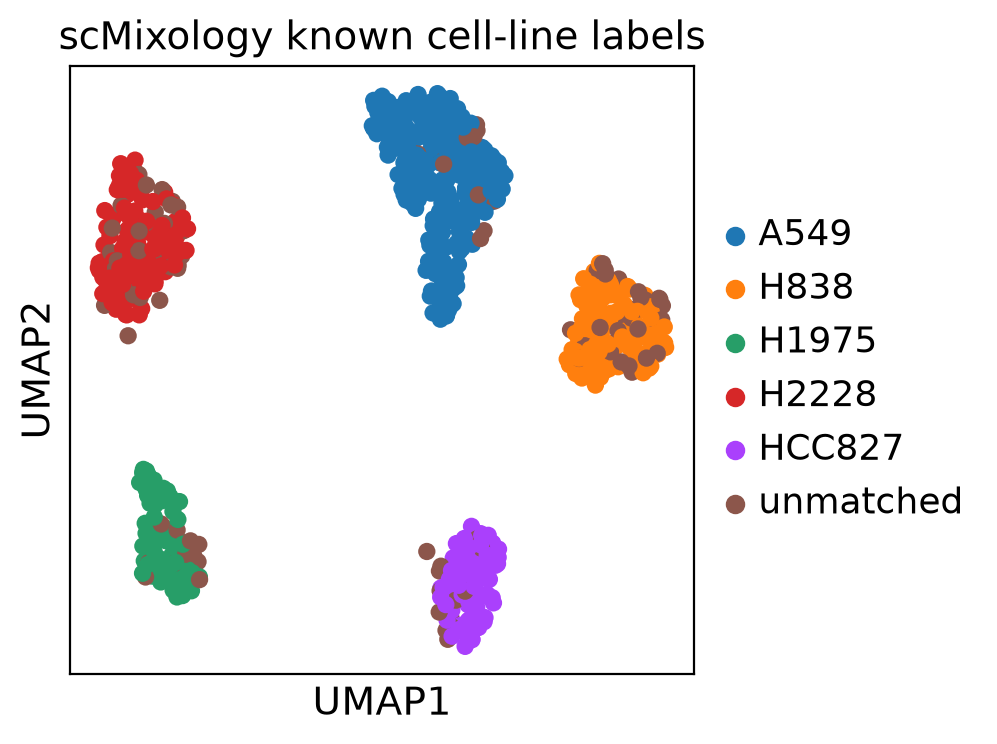

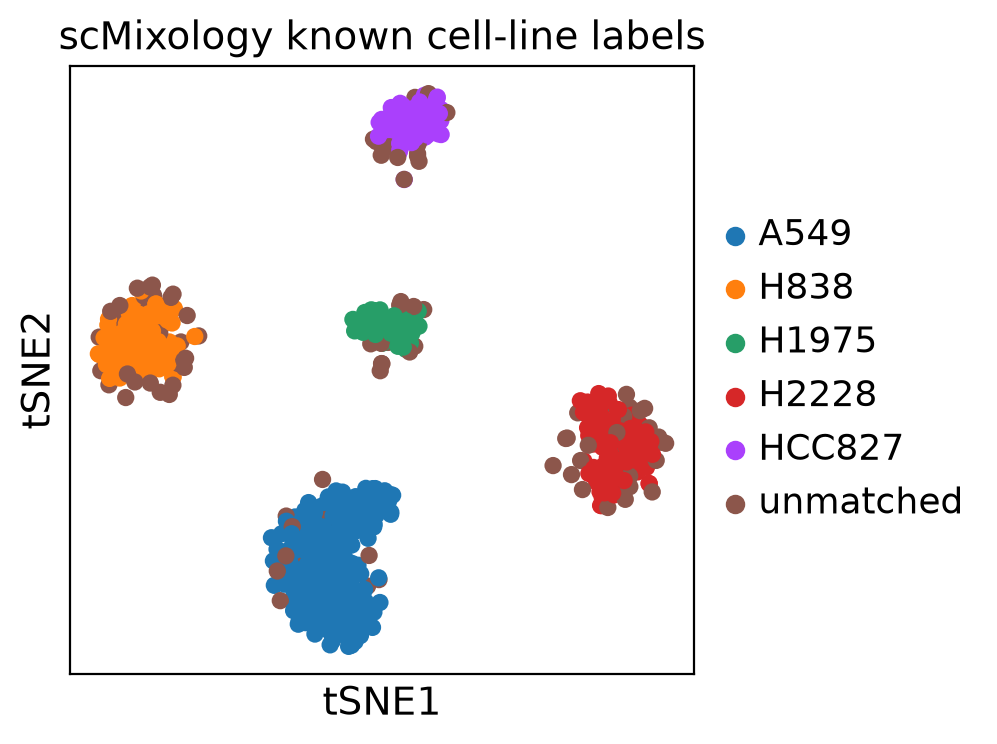

In [32]:
############## or just this
sc.pl.umap(
    adata,
    color="known_label_plot",
    legend_loc="right margin",
    title="scMixology known cell-line labels",
    save=f"_scMixology_scanpy_{VERSION}_UMAP_known_labels.png"
)

sc.pl.tsne(
    adata,
    color="known_label_plot",
    legend_loc="right margin",
    title="scMixology known cell-line labels",
    save=f"_scMixology_scanpy_{VERSION}_tSNE_known_labels.png"
)

## Clustering with Louvain &  Leiden


In [33]:
resolutions = np.round(np.arange(0.1, 2.1, 0.1), 1)

clustering_summary = []

for res in resolutions:
    
    res_key = str(res).replace(".", "")
    
    # Louvain
    louvain_key = f"louvain_res{res_key}"
    sc.tl.louvain(
        adata,
        resolution=res,
        key_added=louvain_key
    )
    
    # Leiden
    leiden_key = f"leiden_res{res_key}"
    sc.tl.leiden(
        adata,
        resolution=res,
        key_added=leiden_key
    )
   
        
    # Save summary info
    clustering_summary.append({
        "resolution": res,
        "louvain_key": louvain_key,
        "louvain_n_clusters": adata.obs[louvain_key].nunique(),
        "leiden_key": leiden_key,
        "leiden_n_clusters": adata.obs[leiden_key].nunique()
    })

clustering_summary = pd.DataFrame(clustering_summary)

clustering_summary.to_csv(
    os.path.join(TABLE_DIR,f"scMixology_scanpy_{VERSION}_resolution_clustering_summary.csv"),
    index=False
)


running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 5 clusters and added
    'louvain_res01', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden_res01', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 5 clusters and added
    'louvain_res02', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden_res02', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 5 clusters and added
    'louvain_res03', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden_res03', the cluster labels (adata.obs, categorical) (0:00:00)
runn

/tmp/ipykernel_24862/1818405886.py:19: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(


    finished: found 5 clusters and added
    'leiden_res04', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 5 clusters and added
    'louvain_res05', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden_res05', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 6 clusters and added
    'louvain_res06', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden_res06', the cluster labels (adata.obs, categorical) (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 6 clusters and added
    'louvain_res07', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    

In [34]:
clustering_summary

,resolution,louvain_key,louvain_n_clusters,leiden_key,leiden_n_clusters
0,0.1,louvain_res01,5,leiden_res01,5
1,0.2,louvain_res02,5,leiden_res02,5
2,0.3,louvain_res03,5,leiden_res03,5
3,0.4,louvain_res04,5,leiden_res04,5
4,0.5,louvain_res05,5,leiden_res05,6
5,0.6,louvain_res06,6,leiden_res06,6
6,0.7,louvain_res07,6,leiden_res07,6
7,0.8,louvain_res08,6,leiden_res08,6
8,0.9,louvain_res09,6,leiden_res09,7
9,1.0,louvain_res10,6,leiden_res10,7


### Summary


#### resolution vs number of clusters plot


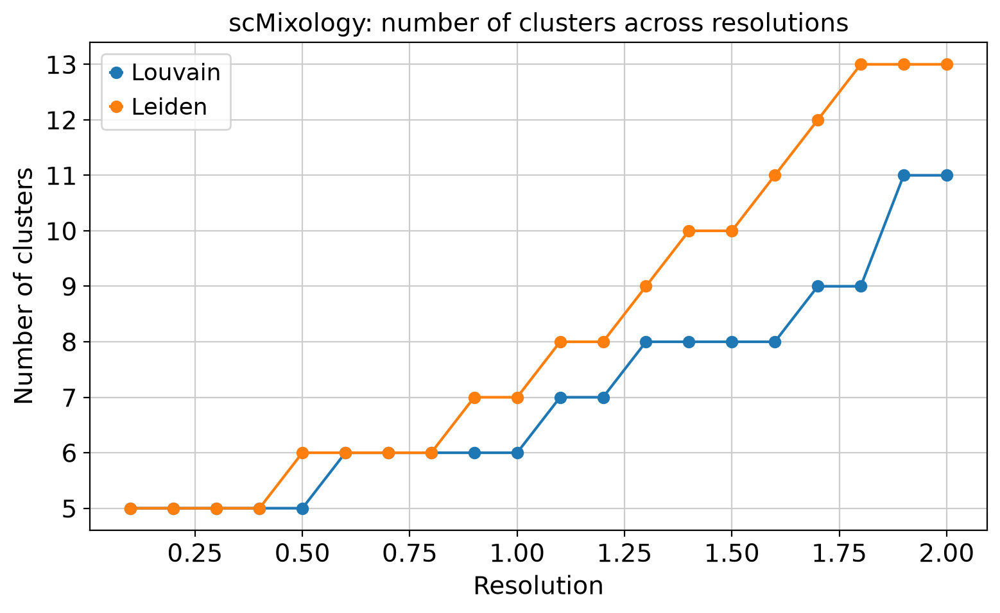

In [35]:
plot_df = clustering_summary.copy()

plt.figure(figsize=(8, 5))
plt.plot(plot_df["resolution"], plot_df["louvain_n_clusters"], marker="o", label="Louvain")
plt.plot(plot_df["resolution"], plot_df["leiden_n_clusters"], marker="o", label="Leiden")
plt.xlabel("Resolution")
plt.ylabel("Number of clusters")
plt.title("scMixology: number of clusters across resolutions")
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(FIGURE_DIR,f"scMixology_scanpy_{VERSION}_resolution_vs_nclusters.png"), dpi=300)
plt.show()

## pyclustree


['louvain_res01', 'louvain_res02', 'louvain_res03', 'louvain_res05', 'louvain_res10', 'louvain_res15', 'louvain_res20']
['leiden_res01', 'leiden_res02', 'leiden_res03', 'leiden_res05', 'leiden_res10', 'leiden_res15', 'leiden_res20']


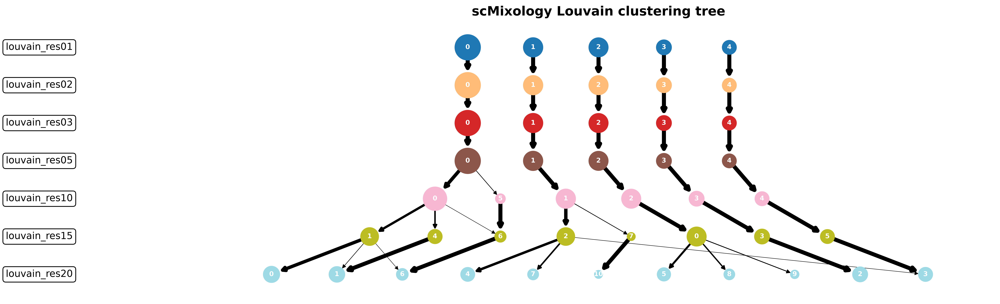

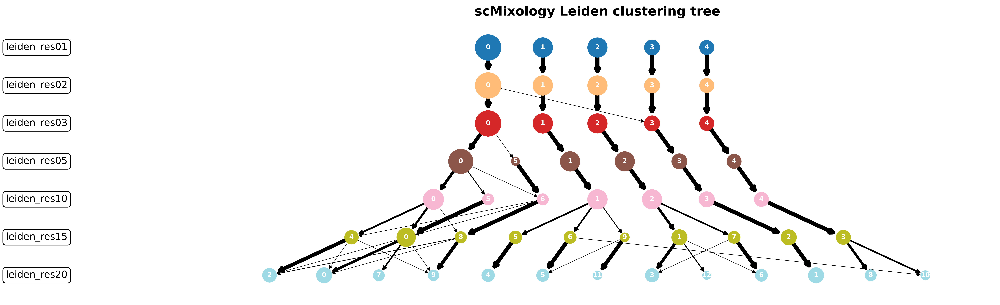

In [36]:
selected_resolutions_for_tree = [0.1, 0.2, 0.3, 0.5, 1.0, 1.5, 2.0]


# Louvain pyclustree
louvain_tree_keys = [
    f"louvain_res{str(r).replace('.', '')}"
    for r in selected_resolutions_for_tree
]

print(louvain_tree_keys)

fig_louvain_tree = clustree(
    adata,
    cluster_keys=louvain_tree_keys,
    title="scMixology Louvain clustering tree"
)

fig_louvain_tree.savefig(
    os.path.join(FIGURE_DIR, f"scMixology_scanpy_{VERSION}_louvain_pyclustree.png"),
    dpi=300,
    bbox_inches="tight"
)


# Leiden pyclustree
leiden_tree_keys = [
    f"leiden_res{str(r).replace('.', '')}"
    for r in selected_resolutions_for_tree
]

print(leiden_tree_keys)

fig_leiden_tree = clustree(
    adata,
    cluster_keys=leiden_tree_keys,
    title="scMixology Leiden clustering tree"
)

fig_leiden_tree.savefig(
    os.path.join(FIGURE_DIR, f"scMixology_scanpy_{VERSION}_leiden_pyclustree.png"),
    dpi=300,
    bbox_inches="tight"
)

#### Louvain UMAPs, t-SNE


In [37]:
selected_resolutions = [0.1, 0.2, 0.3, 0.4, 0.5, 1.0, 1.3, 1.5, 2.0]

selected_louvain = [
    f"louvain_res{str(r).replace('.', '')}"
    for r in selected_resolutions
]


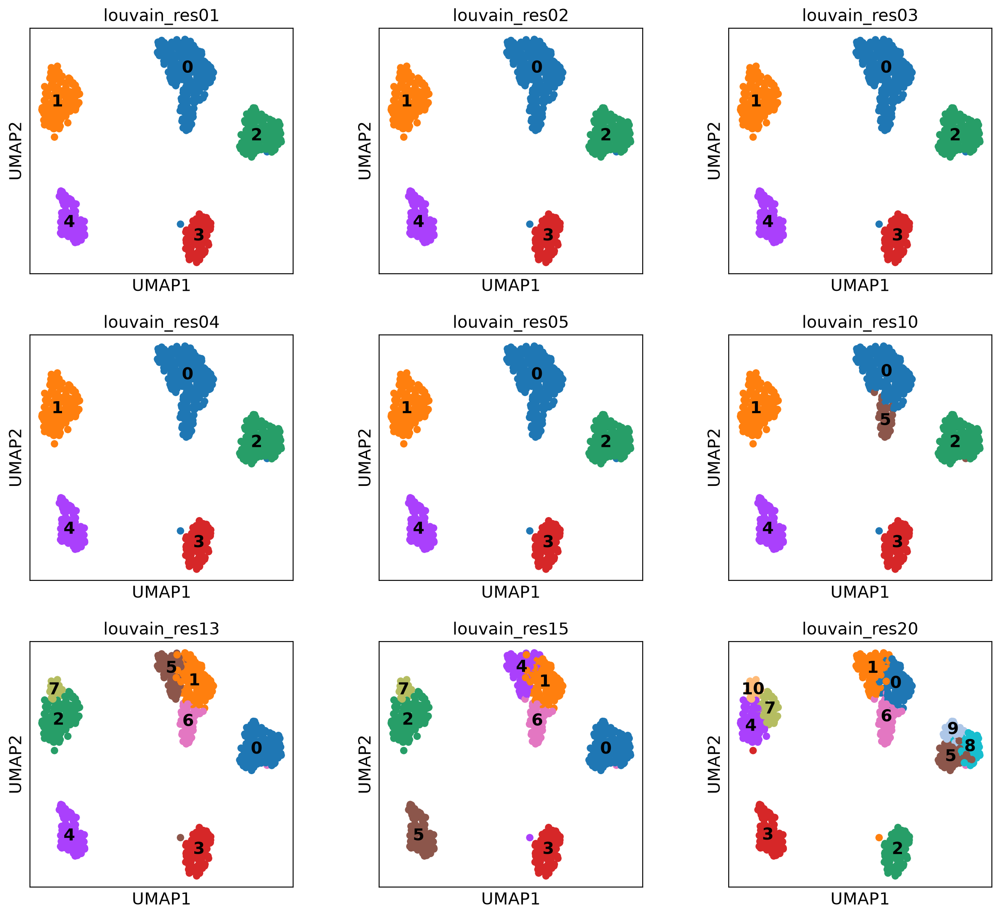

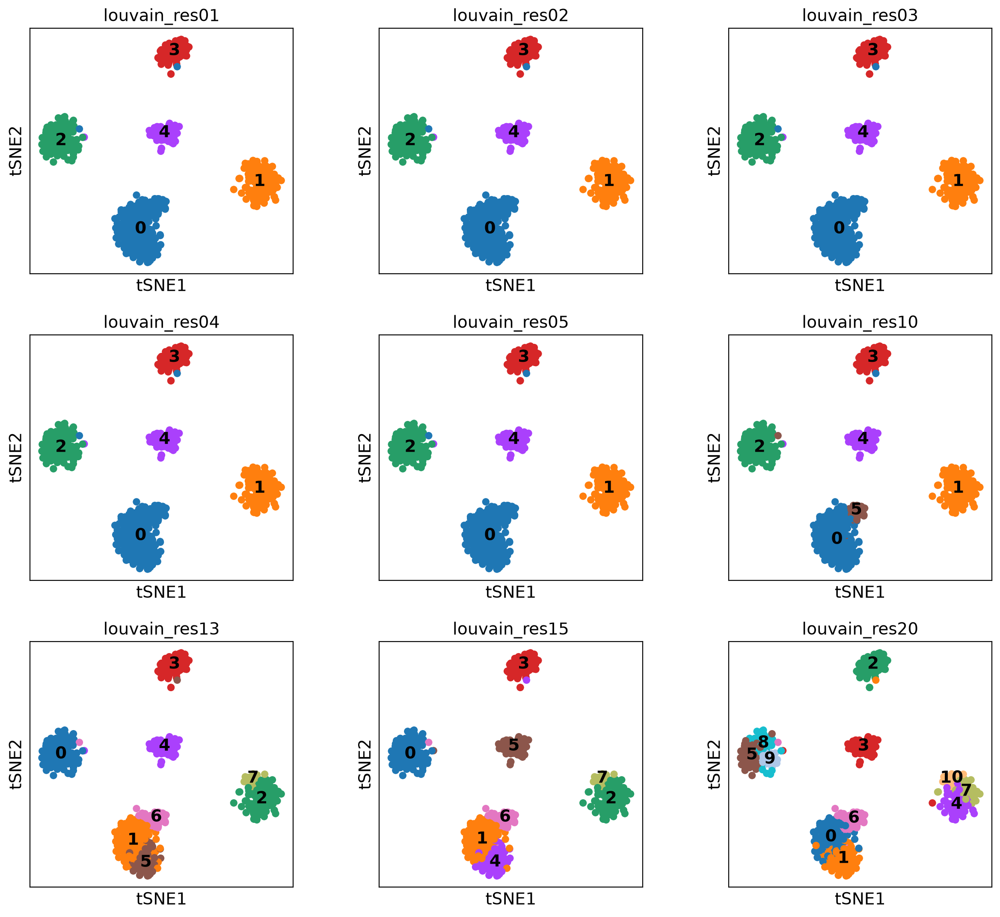

In [38]:
selected_resolutions = [0.1, 0.2, 0.3, 0.4, 0.5, 1.0, 1.3, 1.5, 2.0]

selected_louvain = [
    f"louvain_res{str(r).replace('.', '')}"
    for r in selected_resolutions
]

# UMAP
sc.pl.umap(
    adata,
    color=selected_louvain,
    legend_loc="on data",
    ncols=3,
    save=f"_scMixology_scanpy_{VERSION}_louvain_selected_resolutions.png"
)

# tSNE
sc.pl.tsne(
    adata,
    color=selected_louvain,
    legend_loc="on data",
    ncols=3,
    save=f"_scMixology_scanpy_{VERSION}_louvain_selected_resolutions.png"
)


#### Leiden UMAPs and tSNE


In [39]:
selected_leiden = [
    f"leiden_res{str(r).replace('.', '')}"
    for r in selected_resolutions
]

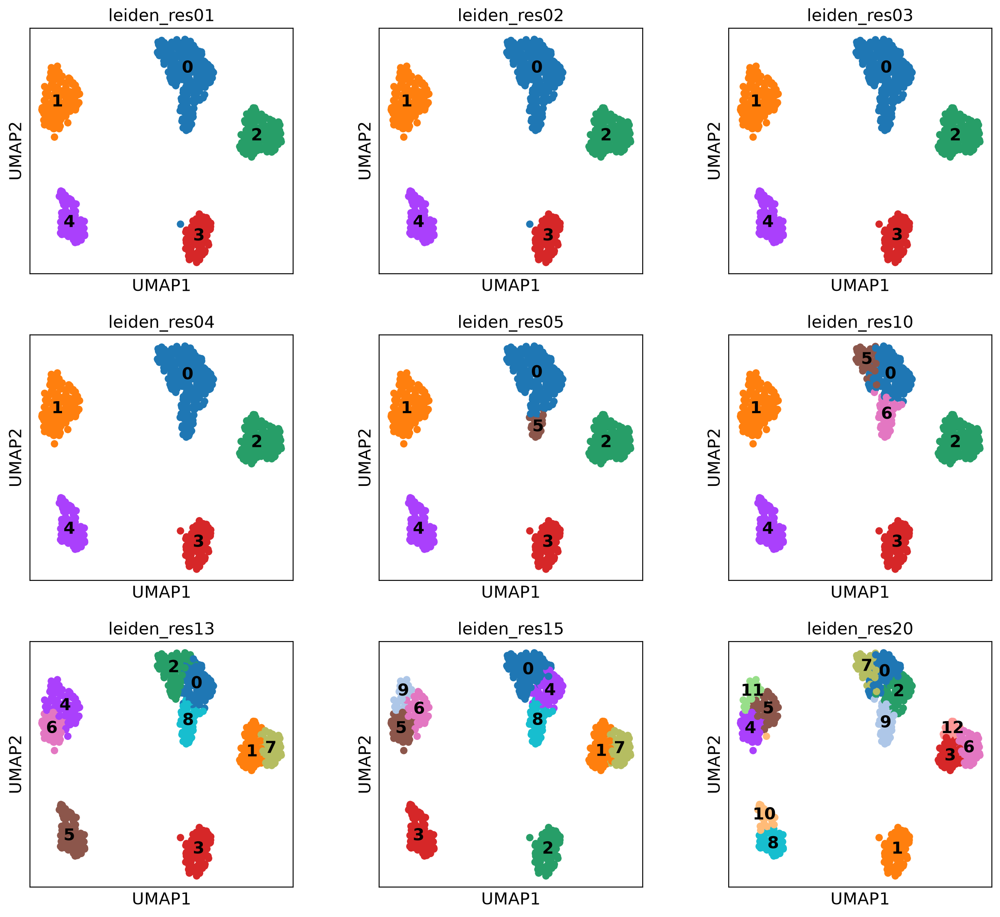

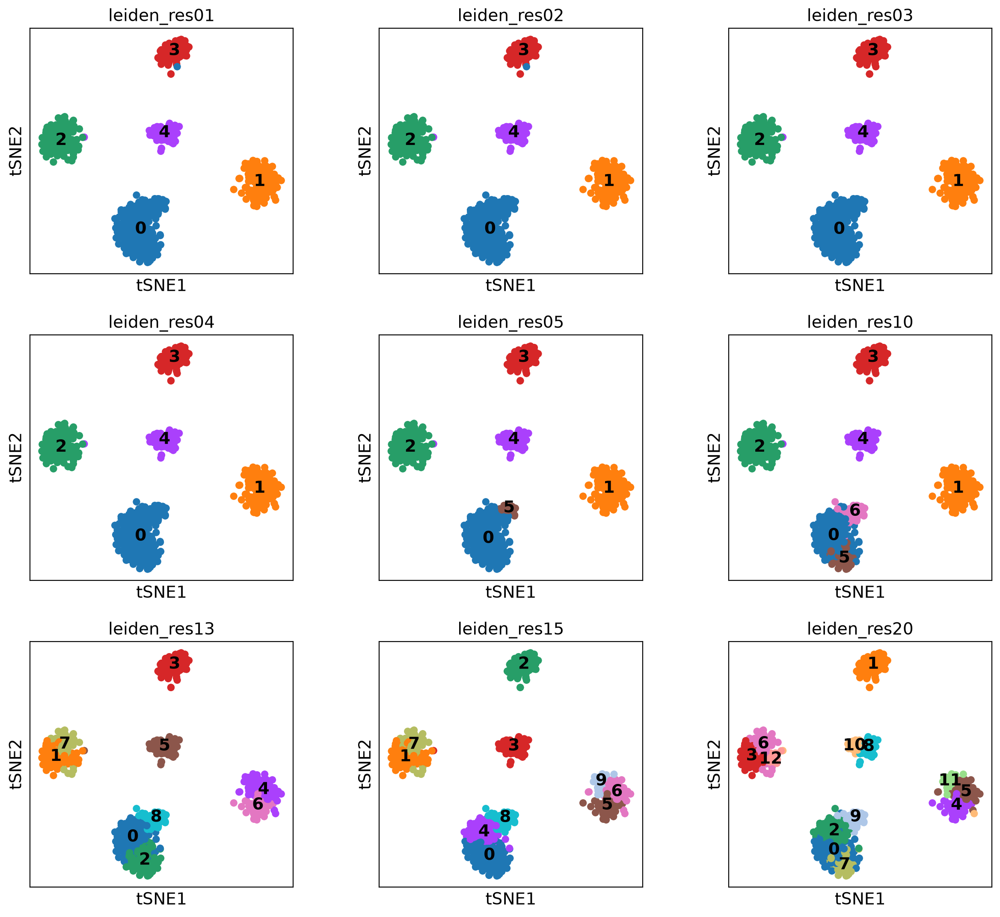

In [40]:
selected_leiden = [
    f"leiden_res{str(r).replace('.', '')}"
    for r in selected_resolutions
]

# UMAP
sc.pl.umap(
    adata,
    color=selected_leiden,
    legend_loc="on data",
    ncols=3,
    save=f"_scMixology_scanpy_{VERSION}_leiden_selected_resolutions.png"
)


# tSNE
sc.pl.tsne(
    adata,
    color=selected_leiden,
    legend_loc="on data",
    ncols=3,
    save=f"_scMixology_scanpy_{VERSION}_leiden_selected_resolutions.png"
)

In [41]:
# check
print(adata.obs.columns[adata.obs.columns.str.contains("louvain_res")])
print(adata.obs.columns[adata.obs.columns.str.contains("leiden_res")])

Index(['louvain_res01', 'louvain_res02', 'louvain_res03', 'louvain_res04',
       'louvain_res05', 'louvain_res06', 'louvain_res07', 'louvain_res08',
       'louvain_res09', 'louvain_res10', 'louvain_res11', 'louvain_res12',
       'louvain_res13', 'louvain_res14', 'louvain_res15', 'louvain_res16',
       'louvain_res17', 'louvain_res18', 'louvain_res19', 'louvain_res20'],
      dtype='object')
Index(['leiden_res01', 'leiden_res02', 'leiden_res03', 'leiden_res04',
       'leiden_res05', 'leiden_res06', 'leiden_res07', 'leiden_res08',
       'leiden_res09', 'leiden_res10', 'leiden_res11', 'leiden_res12',
       'leiden_res13', 'leiden_res14', 'leiden_res15', 'leiden_res16',
       'leiden_res17', 'leiden_res18', 'leiden_res19', 'leiden_res20'],
      dtype='object')


## UMAP and t-SNE with known labels


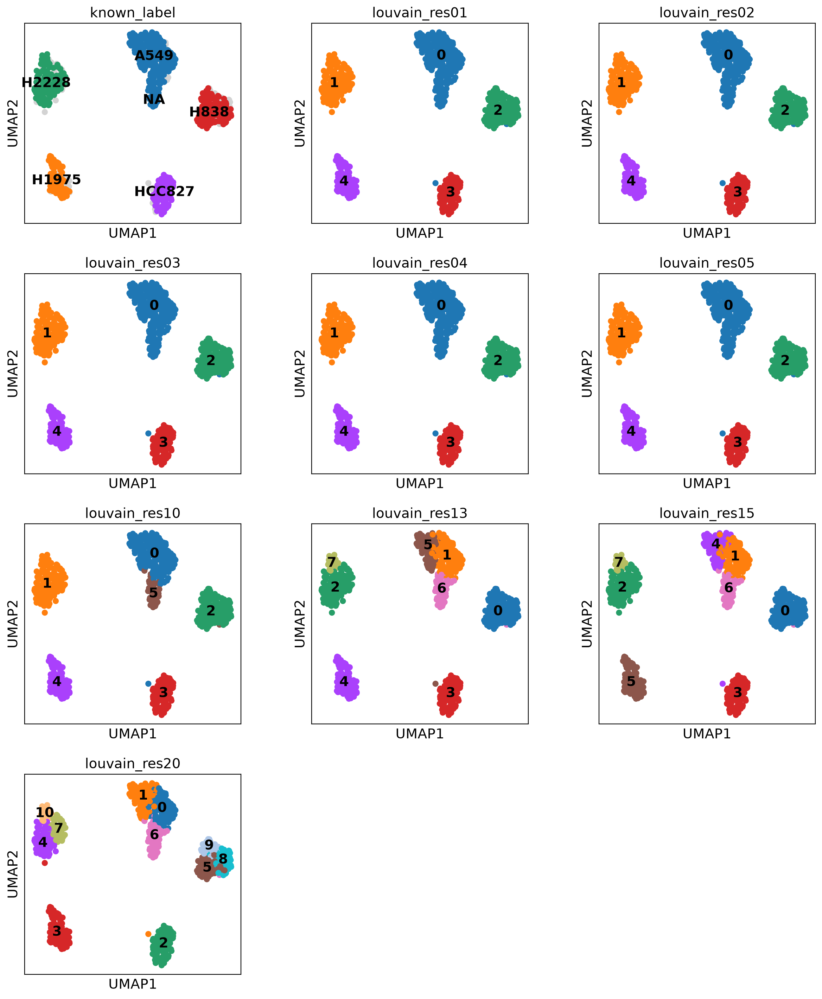

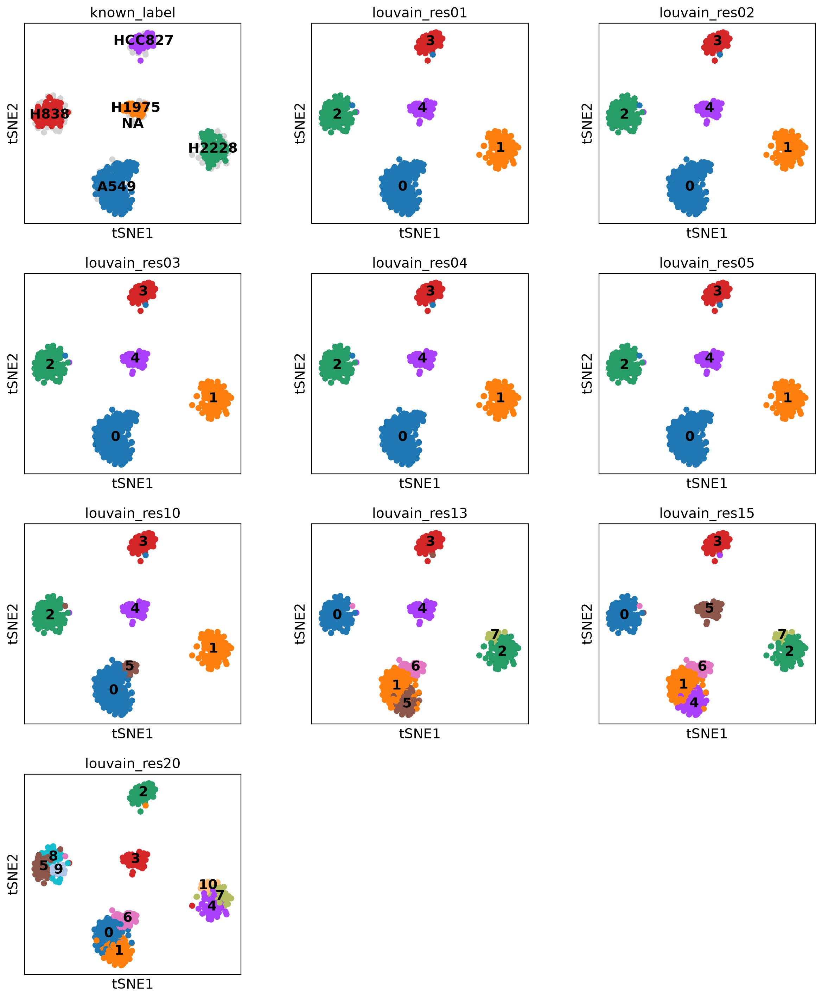

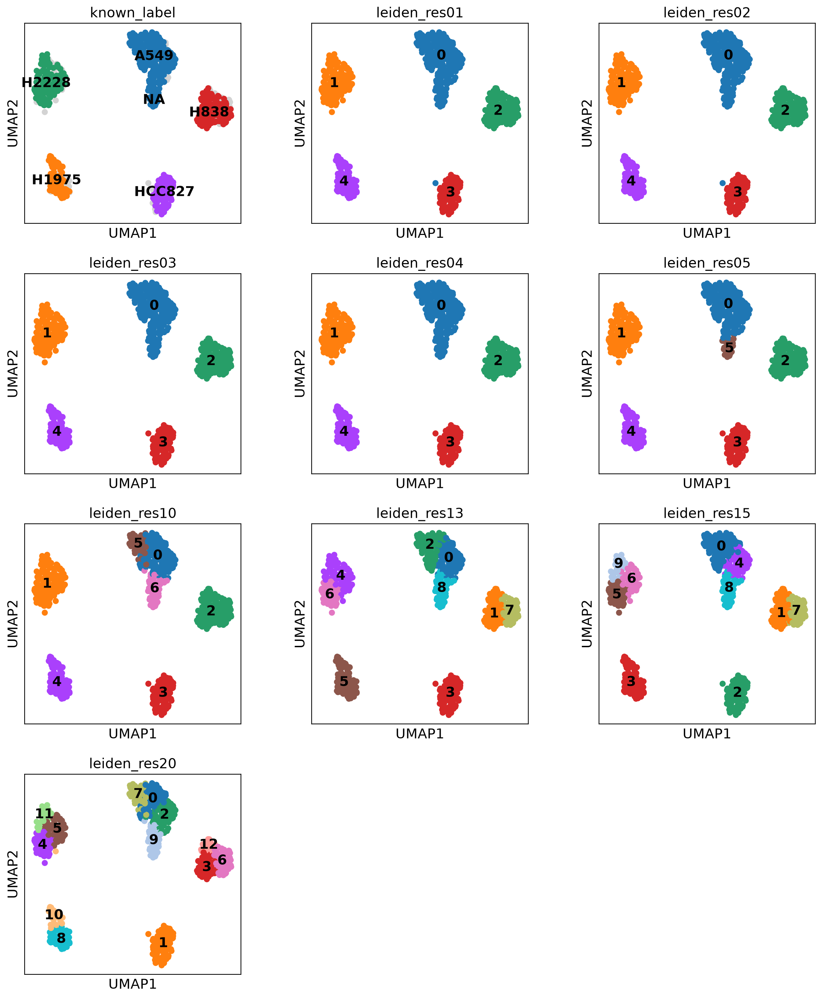

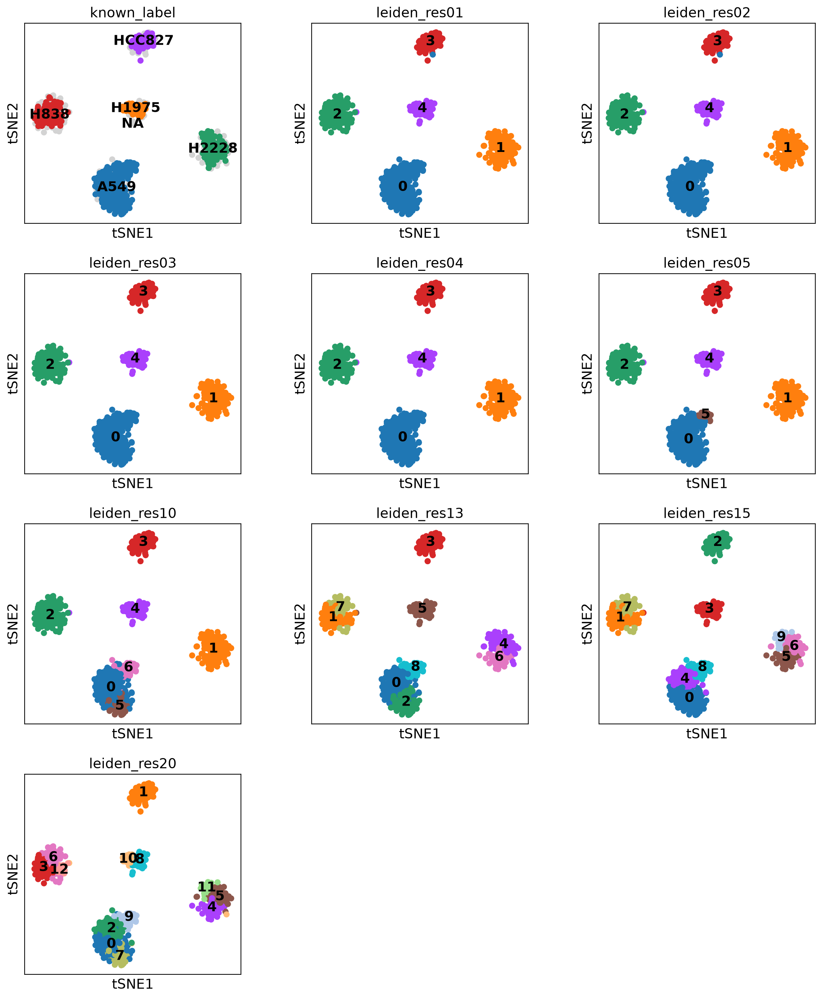

In [42]:
# to add lables 
selected_louvain_with_labels = ["known_label"] + selected_louvain
selected_leiden_with_labels = ["known_label"] + selected_leiden


# Louvain UMAP and tSNE
sc.pl.umap(
    adata,
    color=selected_louvain_with_labels,
    legend_loc="on data",
    ncols=3,
    save=f"_scMixology_scanpy_{VERSION}_louvain_selected_resolutions_with_known_label.png"
)

sc.pl.tsne(
    adata,
    color=selected_louvain_with_labels,
    legend_loc="on data",
    ncols=3,
    save=f"_scMixology_scanpy_{VERSION}_louvain_selected_resolutions_with_known_label.png"
)



# Leiden UMAP and tSNE
sc.pl.umap(
    adata,
    color=selected_leiden_with_labels,
    legend_loc="on data",
    ncols=3,
    save=f"_scMixology_scanpy_{VERSION}_leiden_selected_resolutions_with_known_label.png"
)

sc.pl.tsne(
    adata,
    color=selected_leiden_with_labels,
    legend_loc="on data",
    ncols=3,
    save=f"_scMixology_scanpy_{VERSION}_leiden_selected_resolutions_with_known_label.png"
)

## ARI


In [43]:
FINAL_SELECTED_RESOLUTION = 0.2

In [44]:
# to check all values in known_lablel
adata.obs["known_label"].value_counts(dropna=False)

known_label
A549      262
H2228     130
H838      127
<NA>      102
HCC827     82
H1975      71
Name: count, dtype: int64

In [45]:
# Treat these values as missing/unlabelled
invalid_labels = {
    "",
    "<na>",
    "nan",
    "na",
    "none",
    "unknown",
    "unmatched"
}

# Convert labels to clean strings.
# fillna("") avoids the "boolean value of NA is ambiguous" error.
known_labels = (
    adata.obs["known_label"]
    .astype("string")
    .fillna("")
    .str.strip()
)

results = []

cluster_methods = {
    "Louvain": f"louvain_res{str(FINAL_SELECTED_RESOLUTION).replace('.', '')}",
    "Leiden": f"leiden_res{str(FINAL_SELECTED_RESOLUTION).replace('.', '')}",
}

for method, cluster_key in cluster_methods.items():

    clusters = (
        adata.obs[cluster_key]
        .astype("string")
        .fillna("")
        .str.strip()
    )

    # Keep only cells with:
    # 1. a valid known cell-line label
    # 2. a valid clustering assignment
    labelled = (
        ~known_labels.str.lower().isin(invalid_labels)
        & known_labels.ne("")
        & clusters.ne("")
    )

    true_labels = known_labels.loc[labelled]
    predicted_clusters = clusters.loc[labelled]

    if labelled.sum() > 0:
        ari = adjusted_rand_score(
            true_labels,
            predicted_clusters
        )
    else:
        ari = np.nan

    results.append({
        "method": method,
        "resolution": FINAL_SELECTED_RESOLUTION,
        "cluster_key": cluster_key,
        "cells_used": labelled.sum(),
        "n_clusters": predicted_clusters.nunique(),
        "ARI": ari,
    })

ari_table = pd.DataFrame(results)

# save
ari_table.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_ARI_resolution_{FINAL_SELECTED_RESOLUTION}.csv"),
    index=False
)


ari_table

,method,resolution,cluster_key,cells_used,n_clusters,ARI
0,Louvain,0.2,louvain_res02,672,5,1.0
1,Leiden,0.2,leiden_res02,672,5,1.0


## ARI across all resolutions


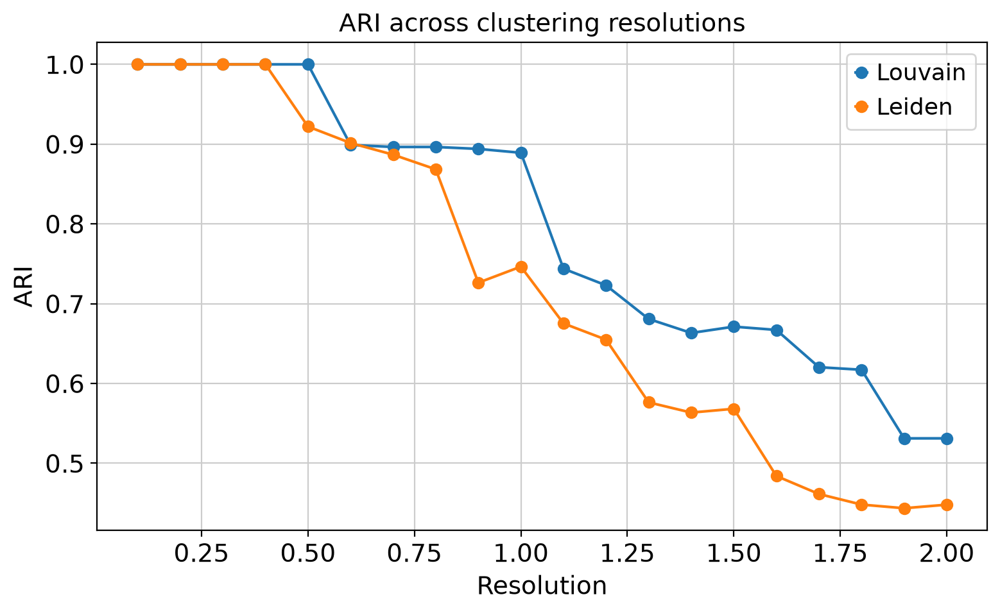

In [46]:
ari_resolution_results = []

known_labels = (
    adata.obs["known_label"]
    .astype("string")
    .fillna("")
    .str.strip()
)

valid_labels = (
    ~known_labels.str.lower().isin(invalid_labels)
    & known_labels.ne("")
)

for res in resolutions:
    res_key = str(res).replace(".", "")

    for method, cluster_key in {
        "Louvain": f"louvain_res{res_key}",
        "Leiden": f"leiden_res{res_key}"
    }.items():

        clusters = (
            adata.obs[cluster_key]
            .astype("string")
            .fillna("")
            .str.strip()
        )

        valid = valid_labels & clusters.ne("")

        if valid.sum() > 0:
            ari = adjusted_rand_score(
                known_labels.loc[valid],
                clusters.loc[valid]
            )
        else:
            ari = np.nan

        ari_resolution_results.append({
            "resolution": res,
            "method": method,
            "cluster_key": cluster_key,
            "n_clusters": clusters.loc[valid].nunique(),
            "cells_used": int(valid.sum()),
            "ARI": ari
        })

ari_resolution_table = pd.DataFrame(ari_resolution_results)

ari_resolution_table.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_ARI_across_resolutions.csv"),
    index=False
)

ari_resolution_table.head()

#plot
plt.figure(figsize=(8, 5))

for method in ari_resolution_table["method"].unique():
    sub = ari_resolution_table[ari_resolution_table["method"] == method]

    plt.plot(
        sub["resolution"],
        sub["ARI"],
        marker="o",
        label=method
    )

plt.xlabel("Resolution")
plt.ylabel("ARI")
plt.title("ARI across clustering resolutions")
plt.legend()
plt.tight_layout()

plt.savefig(
    os.path.join(FIGURE_DIR, f"scMixology_scanpy_{VERSION}_ARI_across_resolutions.png"),
    dpi=300
)

plt.show()

## Find Marker Genes


In [47]:
# select clusering method/result :
cluster_key = FINAL_CLUSTER_KEY

# marker genes detection
sc.tl.rank_genes_groups(
    adata,
    groupby= cluster_key,
    method="wilcoxon",
    use_raw=True,
    key_added=f"rank_genes_{cluster_key}"
)

# table of marker genes
markers = sc.get.rank_genes_groups_df(
    adata,
    group=None,
    key=f"rank_genes_{cluster_key}"
)

markers_filtered = markers[
    (markers["logfoldchanges"] > 0.25) &
    (markers["pvals_adj"] < 0.01)
].copy()

markers_filtered.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_{cluster_key}_filtered_markers_all.csv"),
    index=False
)


print("All markers:", markers.shape)
print("Filtered positive markers:", markers_filtered.shape)
    
markers_filtered.head()

ranking genes
    finished: added to `.uns['rank_genes_louvain_res02']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)
All markers: (131420, 6)
Filtered positive markers: (5893, 6)


,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,AKR1B10,22.811903,6.660402,3.493291e-115,5.934530e-111
1,0,KRT81,22.800669,6.784911,4.515697e-115,5.934530e-111
2,0,ALDH1A1,22.774677,6.819759,8.174102e-115,7.161603e-111
3,0,RPS16,22.685972,1.488963,6.162998e-114,4.049706e-110
4,0,AKR1C2,22.603640,5.402191,3.990879e-113,2.097925e-109


## Select Top 15 and Plot as Heatmap


Number of top marker genes: 75
['AKR1B10', 'KRT81', 'ALDH1A1', 'RPS16', 'AKR1C2', 'AKR1C3', 'GPX2', 'PDE4D', 'S100A4', 'AKR1C1', 'AGR2', 'RPS19', 'G6PD', 'CPLX2', 'CYP24A1', 'SAA1', 'CXCL1', 'CD74', 'LCN2', 'HLA-B', 'RPS15A', 'TPT1', 'B2M', 'CLDN11', 'CXCL6', 'HLA-C', 'BIRC3', 'IGFBP3', 'CPD', 'PDZK1IP1', 'RPS21', 'CFL1', 'C19orf53', 'ATP5F1E', 'MYL9', 'GNG5', 'UBL5', 'CTAG2', 'RPSA', 'SH3BGRL3', 'TTTY14', 'GSTM3', 'TMA7', 'HSPE1', 'ROMO1', 'VOPP1', 'CDKN2A', 'CDK4', 'OS9', 'SEC61G', 'RPL7', 'CHCHD2', 'RPS8', 'ELOC', 'RPL5', 'EGFR', 'TBK1', 'PIP4K2C', 'RPL36A', 'RPS4X', 'LGALS1', 'RPS15', 'MT1E', 'DHRS2', 'RPL28', 'RPL36', 'UQCR10', 'RPS5', 'NDUFA13', 'PRDX2', 'TOMM7', 'MT2A', 'HSPB1', 'ACTB', 'UQCR11']


/tmp/ipykernel_24862/4031492063.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("group")


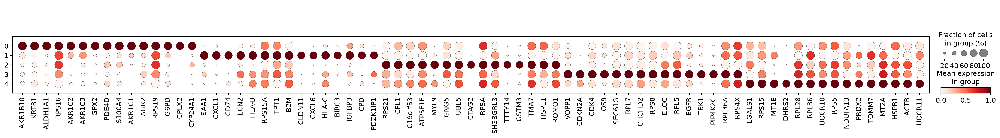

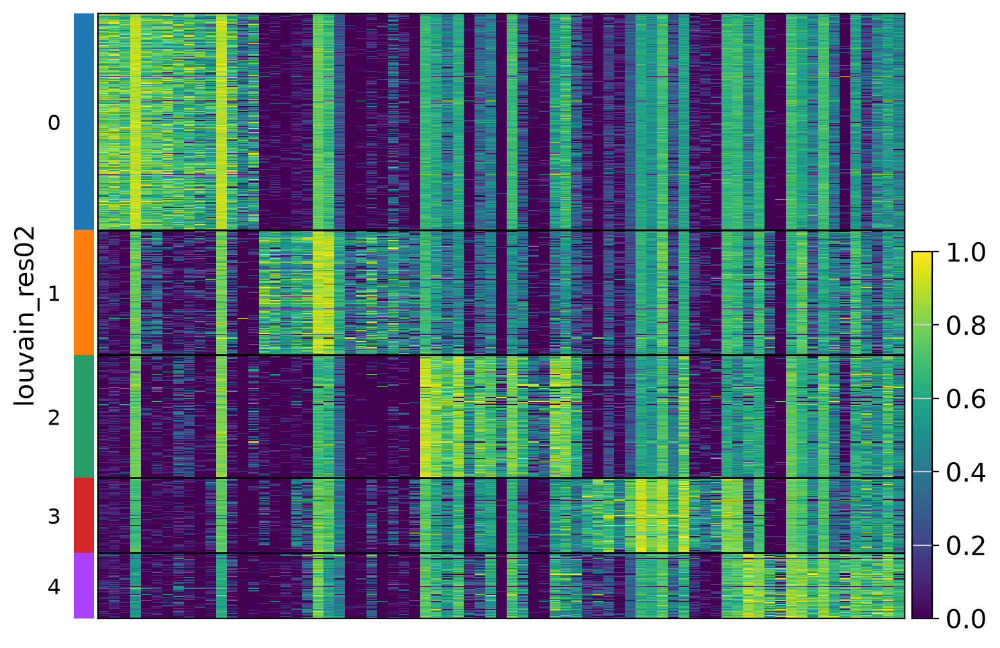

In [48]:
top15_markers = (
    markers_filtered
    .sort_values(["group", "scores"], ascending=[True, False])
    .groupby("group")
    .head(15)
    .copy()
)

top15_markers.to_csv(
    os.path.join(TABLE_DIR,f"scMixology_scanpy_{VERSION}_{cluster_key}_top15_markers.csv"),
    index=False
)

top15_markers.head()

top15_genes = top15_markers["names"].unique().tolist()

print("Number of top marker genes:", len(top15_genes))
print(top15_genes)


# Dotplot
sc.pl.dotplot(
    adata,
    var_names=top15_genes,
    groupby=cluster_key,
    use_raw=True,
    standard_scale="var",
    save=f"_scMixology_scanpy_{VERSION}_{cluster_key}_top15_markers_dotplot.png"
)


# Heatmap
sc.pl.heatmap(
    adata,
    var_names=top15_genes,
    groupby=cluster_key,
    use_raw=True,
    cmap="viridis",
    standard_scale="var",
    save=f"_scMixology_scanpy_{VERSION}_{cluster_key}_top15_markers_heatmap.png"
)

## Select and Plot top 5


/tmp/ipykernel_24862/2753650170.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("group")


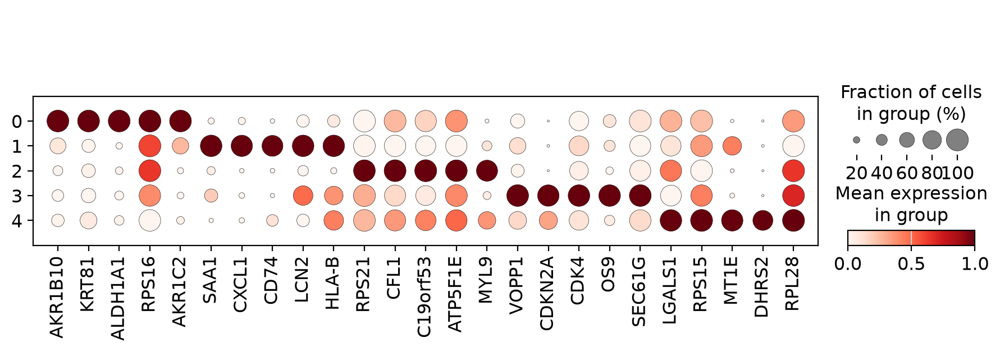

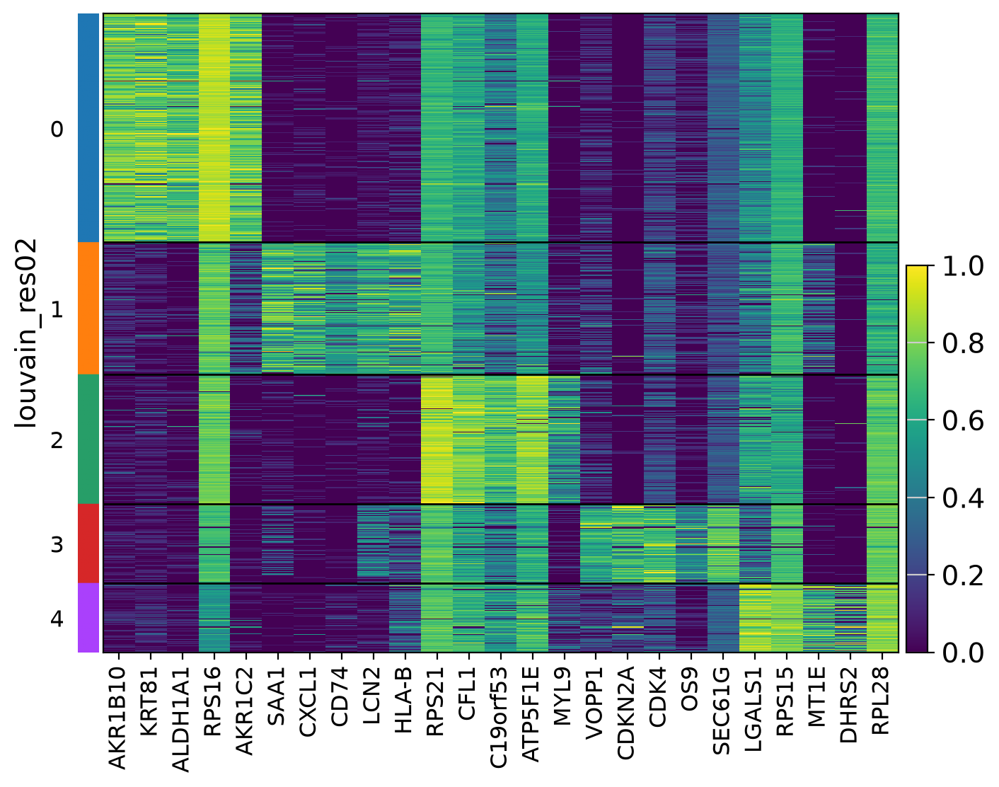

In [49]:
top5_markers = (
    markers_filtered
    .sort_values(["group", "scores"], ascending=[True, False])
    .groupby("group")
    .head(5)
)

top5_genes = top5_markers["names"].unique().tolist()

top5_markers.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_{cluster_key}_top5_markers.csv"),
    index=False
)

# dotplot
sc.pl.dotplot(
    adata,
    var_names=top5_genes,
    groupby=cluster_key,
    use_raw=True,
    standard_scale="var",
    save=f"_scMixology_scanpy_{VERSION}_{cluster_key}_top5_markers_dotplot.png"
)

# heatmap
sc.pl.heatmap(
    adata,
    var_names=top5_genes,
    groupby=cluster_key,
    use_raw=True,
    cmap="viridis",
    standard_scale="var",
    save=f"_scMixology_scanpy_{VERSION}_{cluster_key}_top5_markers_heatmap.png"
)

## Feature plot for top 15 markers from each cluster


Cluster 0:
['AKR1B10', 'KRT81', 'ALDH1A1', 'RPS16', 'AKR1C2', 'AKR1C3', 'GPX2', 'PDE4D', 'S100A4', 'AKR1C1', 'AGR2', 'RPS19', 'G6PD', 'CPLX2', 'CYP24A1']


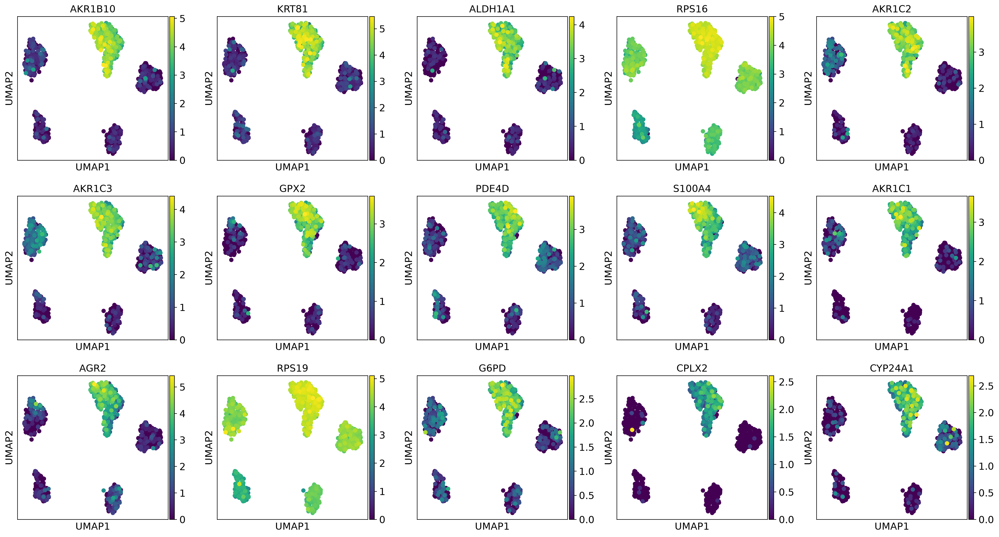

Cluster 1:
['SAA1', 'CXCL1', 'CD74', 'LCN2', 'HLA-B', 'RPS15A', 'TPT1', 'B2M', 'CLDN11', 'CXCL6', 'HLA-C', 'BIRC3', 'IGFBP3', 'CPD', 'PDZK1IP1']


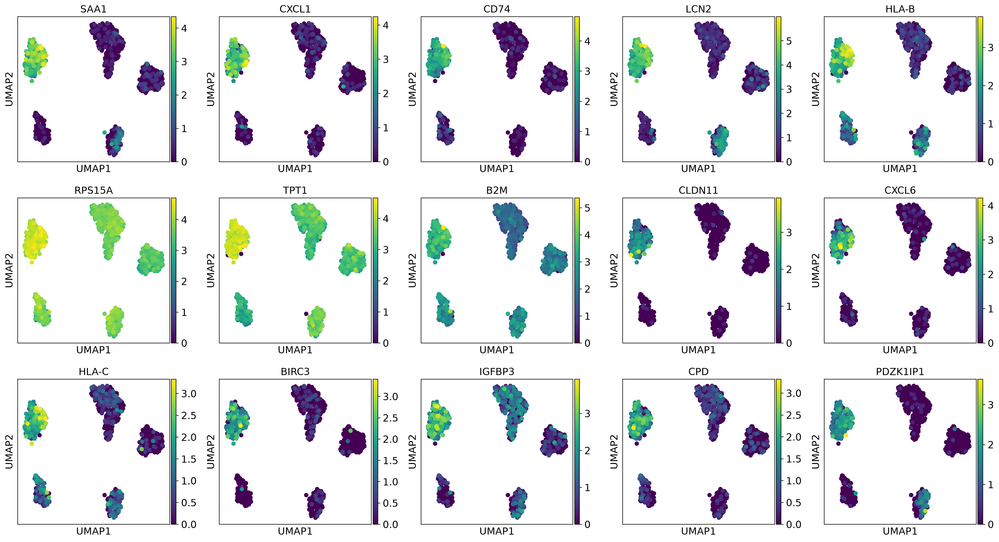

Cluster 2:
['RPS21', 'CFL1', 'C19orf53', 'ATP5F1E', 'MYL9', 'GNG5', 'UBL5', 'CTAG2', 'RPSA', 'SH3BGRL3', 'TTTY14', 'GSTM3', 'TMA7', 'HSPE1', 'ROMO1']


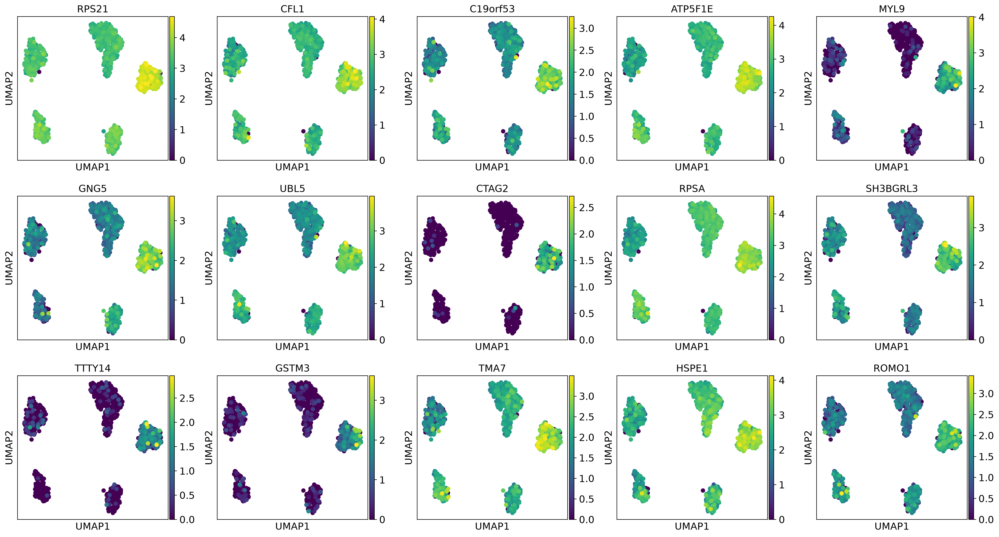

Cluster 3:
['VOPP1', 'CDKN2A', 'CDK4', 'OS9', 'SEC61G', 'RPL7', 'CHCHD2', 'RPS8', 'ELOC', 'RPL5', 'EGFR', 'TBK1', 'PIP4K2C', 'RPL36A', 'RPS4X']


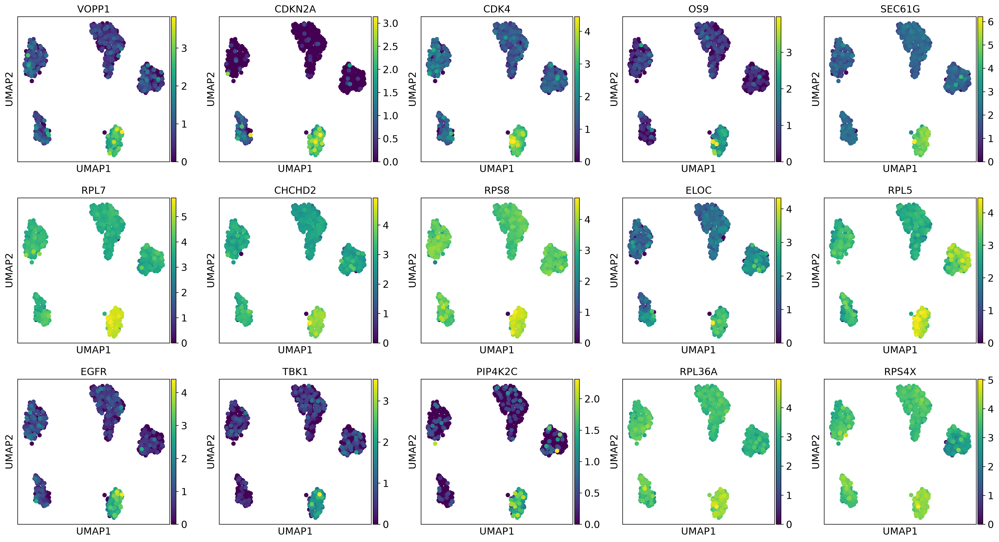

Cluster 4:
['LGALS1', 'RPS15', 'MT1E', 'DHRS2', 'RPL28', 'RPL36', 'UQCR10', 'RPS5', 'NDUFA13', 'PRDX2', 'TOMM7', 'MT2A', 'HSPB1', 'ACTB', 'UQCR11']


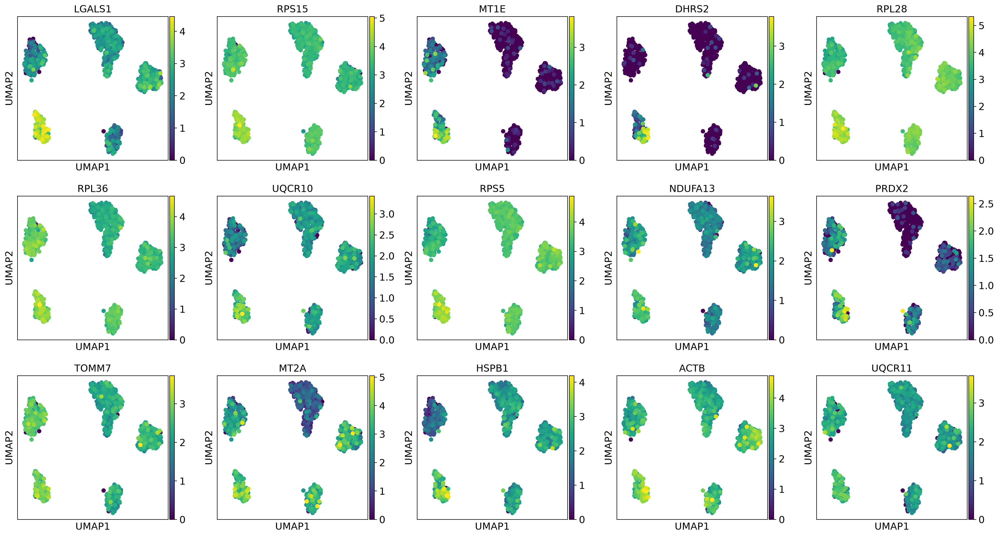

/tmp/ipykernel_24862/315524259.py:29: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby("group")


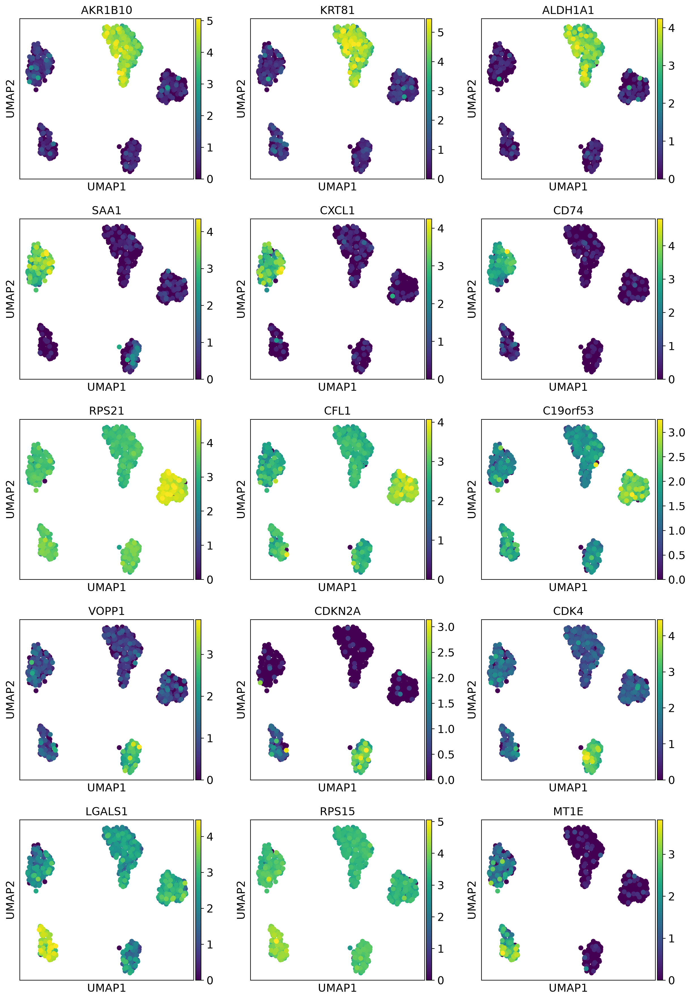

In [50]:

for cluster in top15_markers["group"].unique():

    cluster_marker_genes = (
        top15_markers[top15_markers["group"] == cluster]["names"]
        .unique()
        .tolist()
    )

    print(f"Cluster {cluster}:")
    print(cluster_marker_genes)

    sc.pl.umap(
        adata,
        color=cluster_marker_genes,
        use_raw=True,
        ncols=5,
        cmap="viridis",
        save=f"_scMixology_scanpy_{VERSION}_{cluster_key}_cluster_{cluster}_top15_marker_featureplots_UMAP.png"
    )
    
    
    

# Top 3 markers per cluster for clearer feature plots

top3_markers = (
    markers_filtered
    .sort_values(["group", "scores"], ascending=[True, False])
    .groupby("group")
    .head(3)
    .copy()
)

top3_genes = top3_markers["names"].unique().tolist()

sc.pl.umap(
    adata,
    color=top3_genes,
    use_raw=True,
    ncols=3,
    cmap="viridis",
    save=f"_scMixology_scanpy_{VERSION}_{cluster_key}_top3_markers_featureplots_UMAP.png"
)

## Save Processed Object


In [51]:
processed_file = os.path.join(OBJECT_DIR, f"scMixology_scanpy_{VERSION}_processed.h5ad")

adata.write_h5ad(processed_file)

## Runtime and session info


In [52]:
# Run time
total_runtime_seconds = time.time() - workflow_start

total_runtime = pd.DataFrame([{
    "dataset": DATASET,
    "version": VERSION,
    "total_runtime_seconds": total_runtime_seconds,
    "total_runtime_minutes": total_runtime_seconds / 60,
}])

total_runtime.to_csv(
    os.path.join(TABLE_DIR, f"{DATASET}_{VERSION}_total_runtime.csv"),
    index=False,
)
print(f"total_runtime_minutes: {total_runtime_seconds/60}")


# Session info
session_info = pd.DataFrame([{
    "python_version": platform.python_version(),
    "platform": platform.platform(),
    "scanpy_version": sc.__version__,
    "numpy_version": np.__version__,
    "pandas_version": pd.__version__,
    "anndata_version": ad.__version__,
    "sklearn_version": sklearn.__version__
}])

session_info.to_csv(
    os.path.join(TABLE_DIR, f"scMixology_scanpy_{VERSION}_session_info.csv"),
    index=False
)
session_info

total_runtime_minutes: 1.2866210699081422


/tmp/ipykernel_24862/1458612690.py:22: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('scanpy')` instead
  "scanpy_version": sc.__version__,
/tmp/ipykernel_24862/1458612690.py:25: FutureWarning: `__version__` is deprecated, use `importlib.metadata.version('anndata')` instead.
  "anndata_version": ad.__version__,


,python_version,platform,scanpy_version,numpy_version,pandas_version,anndata_version,sklearn_version
0,3.11.15,Linux-5.13.2-051302-generic-x86_64-with-glibc2.29,1.11.5,2.4.6,2.3.3,0.12.19,1.9.0
